# MultiVariate Analysis Houston Weather-Crime Data

Author: Satindra Kathania (suman)

In [82]:
# Import Libraries 
from pydoc import help # can type in the python console `help(name of function)` to get the documentation
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.patches as mpatches
from sklearn.preprocessing import scale

from scipy import stats
from IPython.display import display, HTML
# figures inline in notebook
%matplotlib inline
np.set_printoptions(suppress=True)
pd.set_option('display.max_rows', 20)
import os

In [66]:
# Set default title color
#plt.style.use('fivethirtyeight')
#plt.rcParams.update({'text.color': "#333333", 
                     'axes.labelcolor': "#333333", 'axes.labelweight': 'bold'})

In [91]:

plt.rcParams.update({'text.color': "#333333", 'axes.labelcolor': "#333333"})

# set default plt figure size
plt.rcParams["figure.figsize"] = [10, 5]
# figure suptitle
plt.rcParams["figure.titlesize"] = 26

plt.rcParams["axes.titlelocation"] = "center"
# title size
plt.rcParams["axes.titlesize"] = 18
# title wight

plt.rcParams["axes.labelweight"] = "normal"


In [182]:
def show_values_on_bars(axs, h_v="v", space=1):
    def _show_on_single_plot(ax):
        if h_v == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height()
                value = int(p.get_height())
                ax.text(_x, _y, value, ha="center",fontsize=18) 
        elif h_v == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height()
                value = int(p.get_width())
                ax.text(_x, _y, value, ha="left",fontsize=18)

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

In [42]:
df=pd.read_csv('Combined_dataEDA.csv')
df.head()

,Date,Offense Count,NIBRS Description,Offense Code,Crime Against,Offense Category,tempmax,tempmin,temp,feelslikemax,...,conditions,Daylight(hr),year,month,day,mon-year,month_num,day_num,season,occurence_hour
0,2010-01-01,1.0,Theft,23H,Property,Larceny/Theft Offenses,53.9,41.3,46.9,53.9,...,Partially cloudy,10.273611,2010,Jan,Fri,Jan 2010,1,5,Winter,8
1,2010-01-01,1.0,Theft,23H,Property,Larceny/Theft Offenses,53.9,41.3,46.9,53.9,...,Partially cloudy,10.273611,2010,Jan,Fri,Jan 2010,1,5,Winter,18
2,2010-01-01,1.0,Burglary,220,Property,Burglary/B&E,53.9,41.3,46.9,53.9,...,Partially cloudy,10.273611,2010,Jan,Fri,Jan 2010,1,5,Winter,24
3,2010-01-01,1.0,Theft,23H,Property,Larceny/Theft Offenses,53.9,41.3,46.9,53.9,...,Partially cloudy,10.273611,2010,Jan,Fri,Jan 2010,1,5,Winter,24
4,2010-01-01,1.0,Theft,23H,Property,Larceny/Theft Offenses,53.9,41.3,46.9,53.9,...,Partially cloudy,10.273611,2010,Jan,Fri,Jan 2010,1,5,Winter,10


### Data was enriched with Crime descriptions, offense code and thier categories mentioned in given pdf resource from Houston police department.

In [43]:
df.shape

(2307150, 38)

### Extracted Year, Month, Day from Occurence Date seperately for groupby operations

In [44]:
df.columns

Index(['Date', 'Offense Count', 'NIBRS Description', 'Offense Code',
       'Crime Against', 'Offense Category', 'tempmax', 'tempmin', 'temp',
       'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity',
       'precip', 'precipcover', 'preciptype', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'moonphase', 'conditions',
       'Daylight(hr)', 'year', 'month', 'day', 'mon-year', 'month_num',
       'day_num', 'season', 'occurence_hour'],
      dtype='object')

In [ ]:
#Missing Value imputed with mean/median already

In [45]:
num_cols = []
for i in df.columns:
  if df[i].dtype == 'float':
    num_cols.append(i)

In [46]:

for i , v in enumerate(num_cols):
  print(i,v)

0 Offense Count
1 tempmax
2 tempmin
3 temp
4 feelslikemax
5 feelslikemin
6 feelslike
7 dew
8 humidity
9 precip
10 precipcover
11 snowdepth
12 windgust
13 windspeed
14 winddir
15 sealevelpressure
16 cloudcover
17 visibility
18 solarradiation
19 solarenergy
20 uvindex
21 moonphase
22 Daylight(hr)


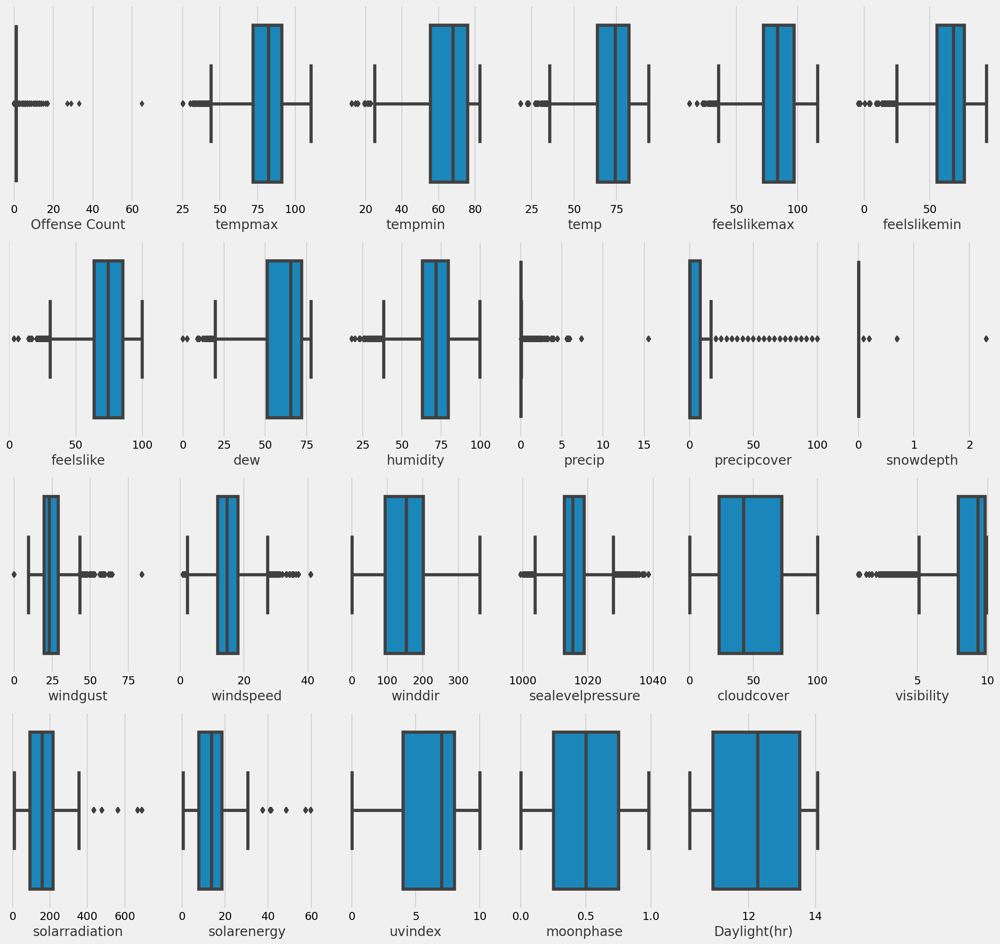

In [593]:
# checking effect after outlier removal
plt.figure(figsize= (20,30))
for i,v in enumerate(num_cols):
  plt.subplot(6,6,i+1)
  sns.boxplot(df[v])

In [47]:
# Removing the outliers
def removeOutliers(data, col):
    Q3 = np.quantile(data[col], 0.75)
    Q1 = np.quantile(data[col], 0.25)
    IQR = Q3 - Q1
 
    print("IQR value for column %s is: %s" % (col, IQR))
    global outlier_free_list
    global filtered_data
 
    lower_range = Q1 - 1.5 * IQR
    upper_range = Q3 + 1.5 * IQR
    print("Lower range for column %s is: %s" % (col, lower_range))
    print("Upper range for column %s is: %s" % (col, upper_range))
    outlier_free_list = [x for x in data[col] if (
        (x > lower_range) & (x < upper_range))]
    filtered_data = data.loc[data[col].isin(outlier_free_list)]

In [222]:
for i in num_cols:
     removeOutliers(df, i)

IQR value for column Offense Count is: 0.0
Lower range for column Offense Count is: 1.0
Upper range for column Offense Count is: 1.0
IQR value for column tempmax is: 19.099999999999994
Lower range for column tempmax is: 43.35000000000001
Upper range for column tempmax is: 119.74999999999999
IQR value for column tempmin is: 20.4
Lower range for column tempmin is: 24.8
Upper range for column tempmin is: 106.39999999999999
IQR value for column temp is: 18.799999999999997
Lower range for column temp is: 35.300000000000004
Upper range for column temp is: 110.5
IQR value for column feelslikemax is: 24.799999999999997
Lower range for column feelslikemax is: 34.800000000000004
Upper range for column feelslikemax is: 134.0
IQR value for column feelslikemin is: 20.4
Lower range for column feelslikemin is: 24.8
Upper range for column feelslikemin is: 106.39999999999999
IQR value for column feelslike is: 21.900000000000006
Lower range for column feelslike is: 30.64999999999999
Upper range for colu

In [49]:
filtered_data.shape # outlier free data

(2307150, 38)

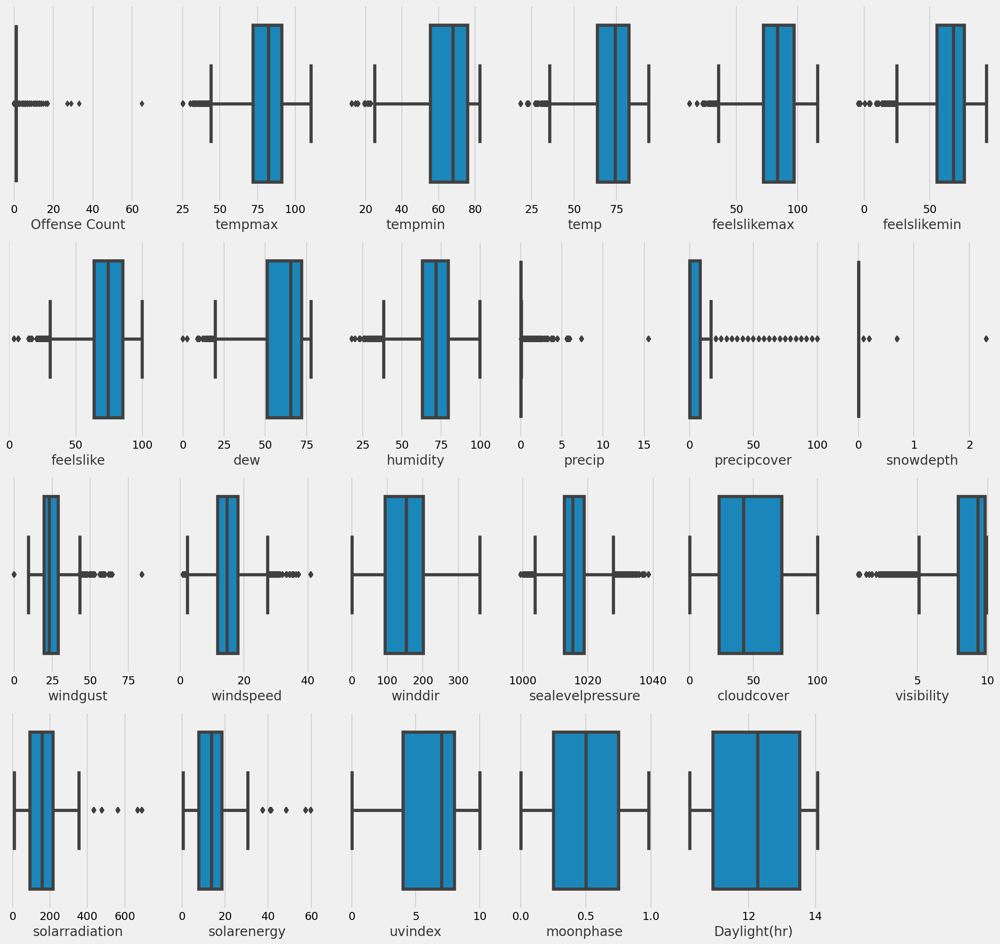

In [590]:
plt.figure(figsize= (20,30))
for i,v in enumerate(num_cols):
  plt.subplot(6,6,i+1)
  sns.boxplot(filtered_data[v])

## Aggregating data by Date, for Daily offense counts

In [189]:
yearly_offense = filtered_data.groupby(["year"])["Offense Count"].sum().sort_values(ascending=True).reset_index()
yearly_offense = yearly_offense.sort_values("year")
yearly_offense

,year,Offense Count
7,2010,137891.0
4,2011,128735.0
5,2012,129011.0
6,2013,131610.0
0,2014,113047.0
2,2015,122399.0
3,2016,124964.0
1,2017,121166.0
9,2018,198375.0
10,2019,227091.0


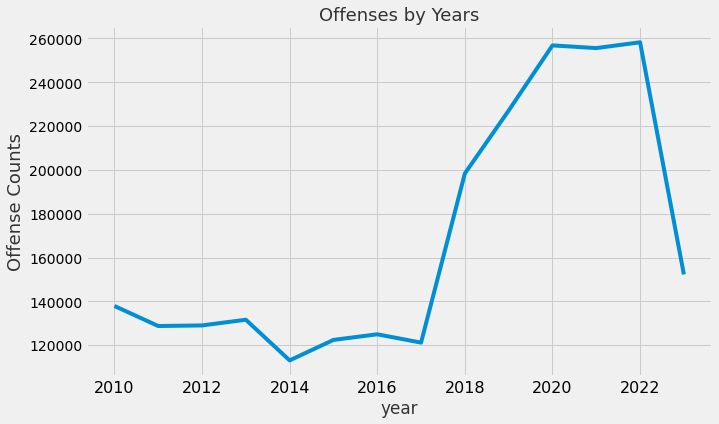

In [191]:
plt.close()
plt.figure(figsize=(10,6))
sns.lineplot(x = "year", y = "Offense Count", data = yearly_offense);
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses by Years",fontsize=18);
plt.xticks(fontsize=16);


## MOnthly

In [192]:
Monthly_offense = filtered_data.groupby(["month",'month_num'])["Offense Count"].sum().sort_values(ascending=True).reset_index()
Monthly_offense = Monthly_offense.sort_values("month_num")
Monthly_offense

,month,month_num,Offense Count
8,Jan,1,201854.0
0,Feb,2,177381.0
5,Mar,3,196980.0
6,Apr,4,197496.0
10,May,5,211136.0
11,Jun,6,212230.0
9,Jul,7,209491.0
7,Aug,8,198885.0
2,Sep,9,186825.0
4,Oct,10,194141.0


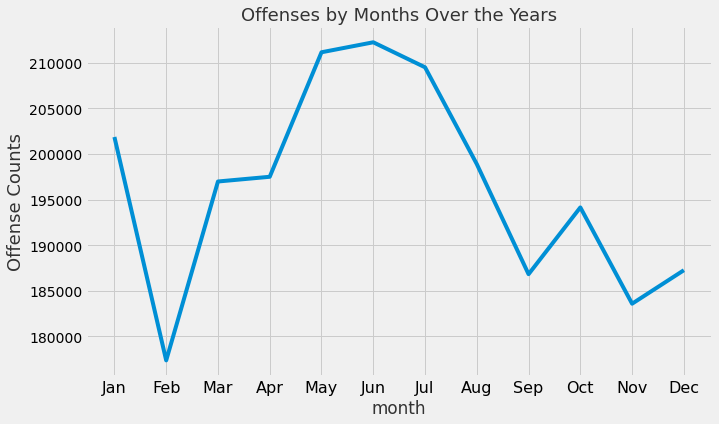

In [193]:
plt.close()
plt.figure(figsize=(10,6))
sns.lineplot(x = "month", y = "Offense Count", data = Monthly_offense);
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses by Months Over the Years",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(np.arange(2007,2023,1),rotation = 90)

## by Days

In [194]:
Daily_offense = filtered_data.groupby(["day",'day_num'])["Offense Count"].sum().sort_values(ascending=True).reset_index()
Daily_offense=Daily_offense.sort_values("day_num")
Daily_offense

,day,day_num,Offense Count
5,Mon,1,341389.0
1,Tue,2,332324.0
2,Wed,3,335063.0
3,Thu,4,335435.0
6,Fri,5,355865.0
4,Sat,6,338408.0
0,Sun,7,318788.0


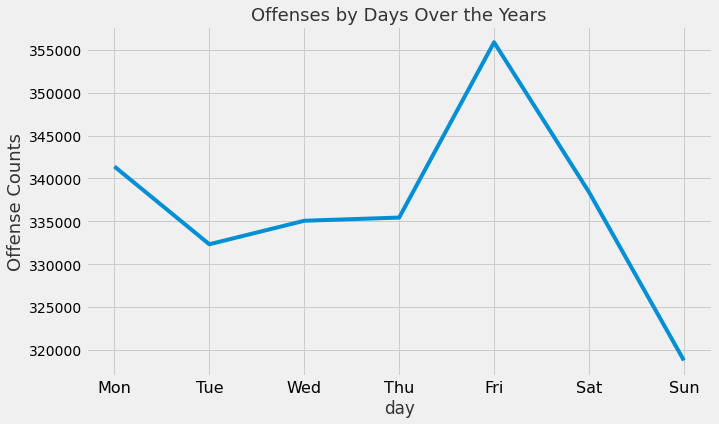

In [195]:
plt.close()
plt.figure(figsize=(10,6))
sns.lineplot(x = "day", y = "Offense Count", data = Daily_offense);
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses by Days Over the Years",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(np.arange(2007,2023,1),rotation = 90)

In [196]:
Daily_offense = filtered_data.groupby(['season',"mon-year","day","month","month_num","year",'day_num'])["Offense Count"].sum().sort_values(ascending=True).reset_index()
Daily_offense=Daily_offense.sort_values(["year","month_num","day_num"])
Daily_offense

,season,mon-year,day,month,month_num,year,day_num,Offense Count
368,Winter,Jan 2010,Mon,Jan,1,2010,1,1468.0
354,Winter,Jan 2010,Tue,Jan,1,2010,2,1457.0
414,Winter,Jan 2010,Wed,Jan,1,2010,3,1508.0
393,Winter,Jan 2010,Thu,Jan,1,2010,4,1490.0
693,Winter,Jan 2010,Fri,Jan,1,2010,5,2010.0
...,...,...,...,...,...,...,...,...
909,Summer,Jul 2023,Wed,Jul,7,2023,3,2866.0
822,Summer,Jul 2023,Thu,Jul,7,2023,4,2729.0
913,Summer,Jul 2023,Fri,Jul,7,2023,5,2877.0
1124,Summer,Jul 2023,Sat,Jul,7,2023,6,3769.0


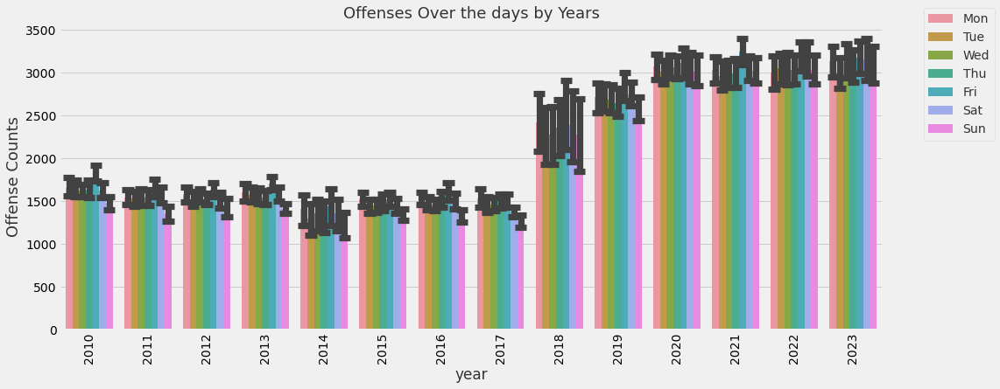

In [197]:
plt.close()
plt.figure(figsize=(15,6))
sns.barplot(x = "year", y = "Offense Count", data = Daily_offense,hue="day",estimator=np.mean, ci=85,  ecolor='grey',linewidth=2,capsize=.2);
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over the days by Years",fontsize=18);
#plt.xticks(fontsize=12);
plt.xticks(rotation = 90);
plt.legend(bbox_to_anchor=(1.05, 1.05), loc='upper left', borderaxespad=0);

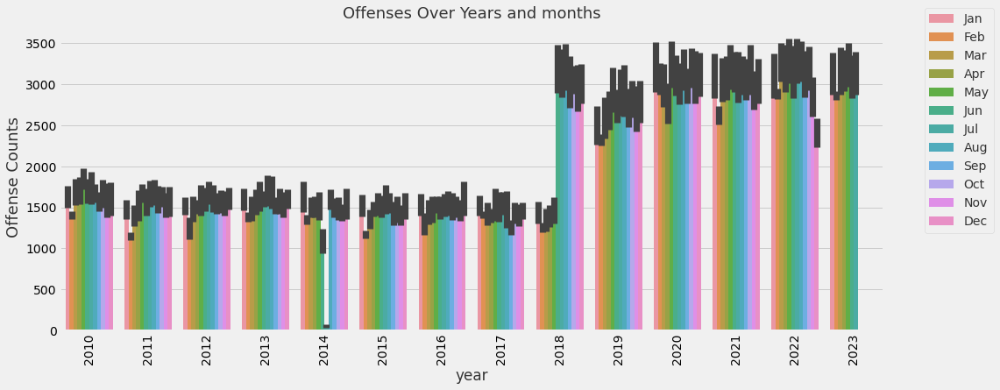

In [198]:
plt.close()
plt.figure(figsize=(15,6))
sns.barplot(x = "year", y = "Offense Count", data = Daily_offense,hue="month");
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over Years and months",fontsize=18);
#plt.xticks(fontsize=12);
plt.xticks(rotation = 90);
plt.legend(bbox_to_anchor=(1.05, 1.05), loc='upper left', borderaxespad=0);

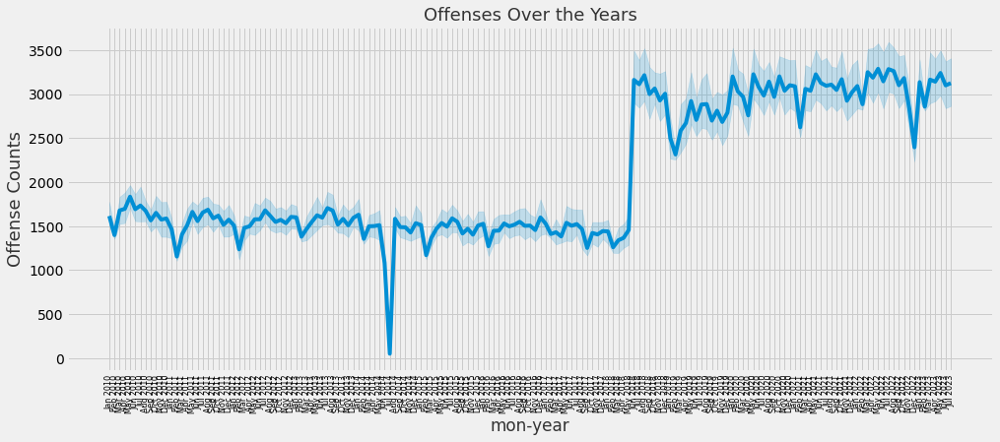

In [93]:
plt.close()
plt.figure(figsize=(15,6))
sns.lineplot(x = "mon-year", y = "Offense Count", data = Daily_offense);
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over the Years",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=8);
plt.xticks(rotation = 90);

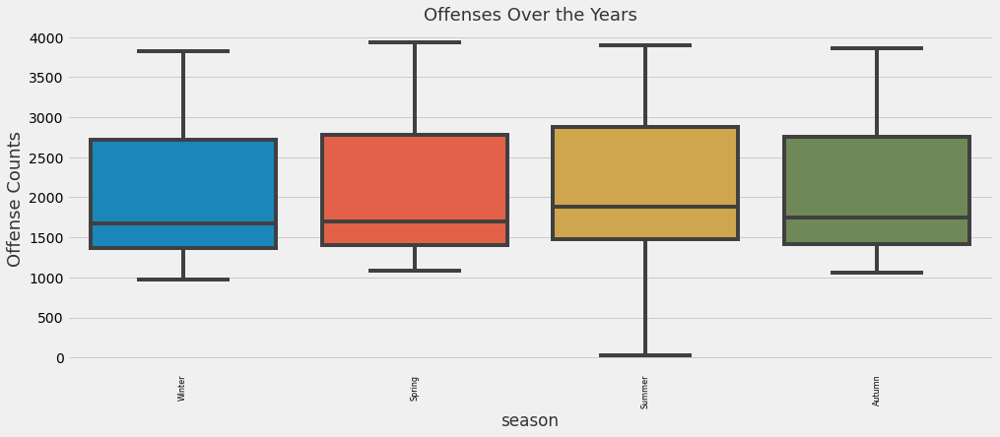

In [96]:
plt.close()
plt.figure(figsize=(15,6))
sns.boxplot(x = "season", y = "Offense Count", data = Daily_offense);
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over the Years",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=8);
plt.xticks(rotation = 90);

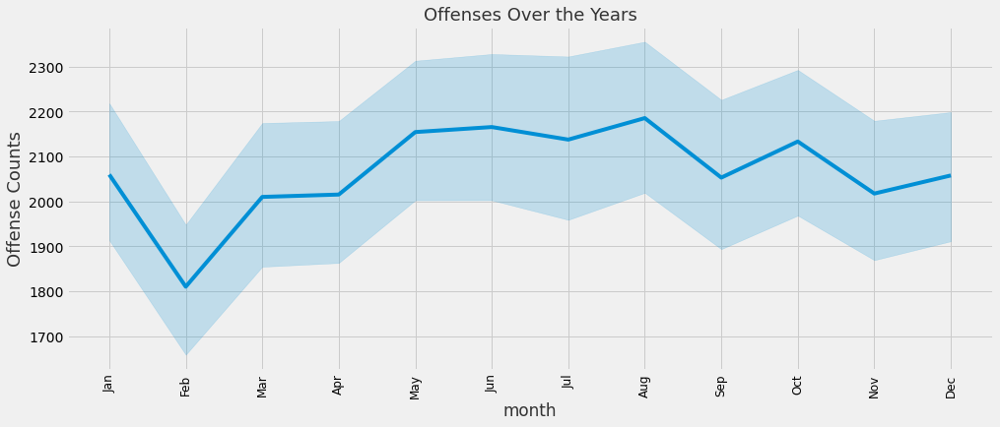

In [95]:
plt.close()
plt.figure(figsize=(15,6))
sns.lineplot(x = "month", y = "Offense Count", data = Daily_offense);
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over the Years",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=12);
plt.xticks(rotation = 90);

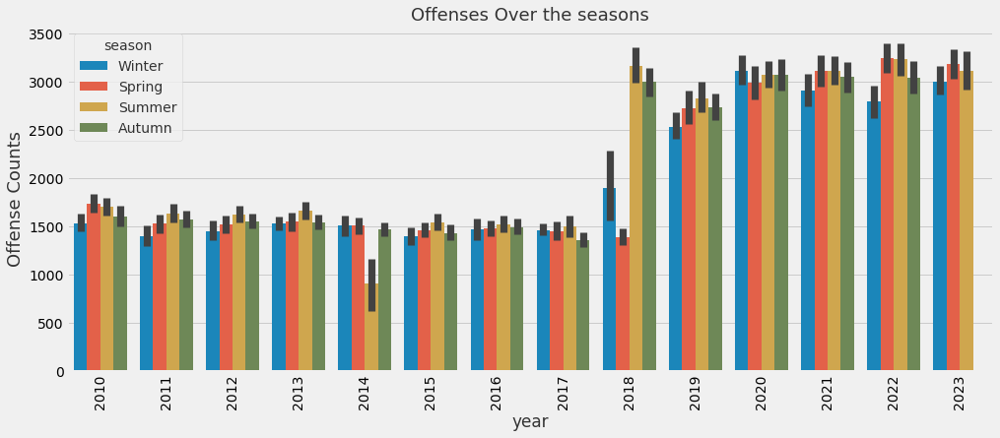

In [118]:
plt.close()
plt.figure(figsize=(15,6))
sns.barplot(x = "year", y = "Offense Count", data = Daily_offense,hue="season");
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over the seasons",fontsize=18);
#plt.xticks(fontsize=12);
plt.xticks(rotation = 90);

In [107]:
C_hr=df.groupby(["occurence_hour","year"])["Offense Count"].sum().sort_values(ascending=False).reset_index()
C_hr=C_hr.sort_values(by="occurence_hour")
C_hr

,occurence_hour,year,Offense Count
0,1,2013,37028.0
78,1,2020,9551.0
79,1,2022,9487.0
47,1,2010,11754.0
113,1,2019,7560.0
...,...,...,...
288,24,2015,3006.0
140,24,2012,7039.0
21,24,2021,13482.0
81,24,2018,9205.0


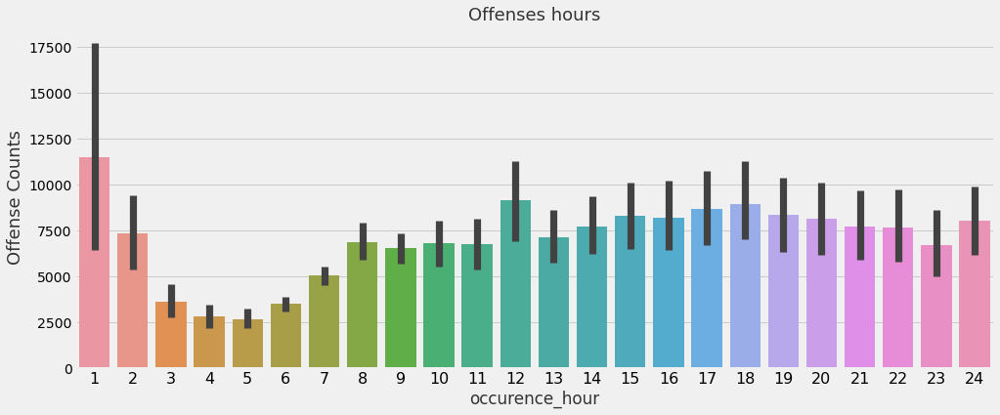

In [114]:
# by Occurence hour
plt.close()
plt.figure(figsize=(15,6))
sns.barplot(x = "occurence_hour", y = "Offense Count", data = C_hr);

plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses hours",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);

#plt.xticks(rotation = 90);

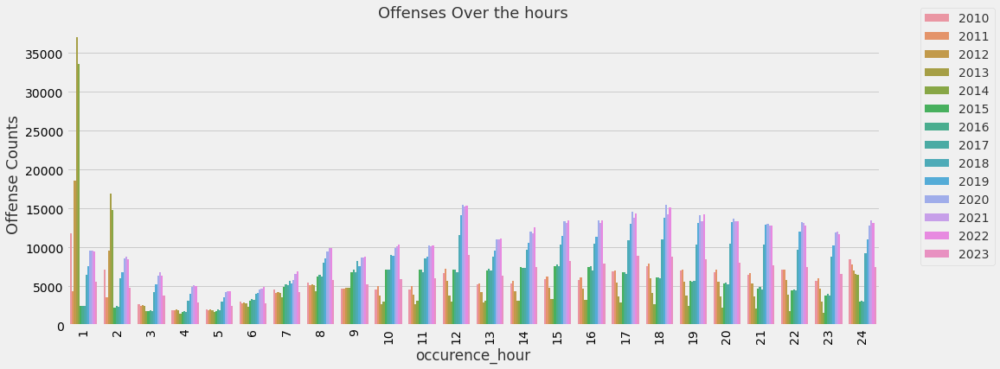

In [115]:
plt.close()
plt.figure(figsize=(15,6))
sns.barplot(x = "occurence_hour", y = "Offense Count", data = C_hr,hue="year");
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over the hours",fontsize=18);
#plt.xticks(fontsize=12);
plt.xticks(rotation = 90);
plt.legend(bbox_to_anchor=(1.05, 1.05), loc='upper left', borderaxespad=0);

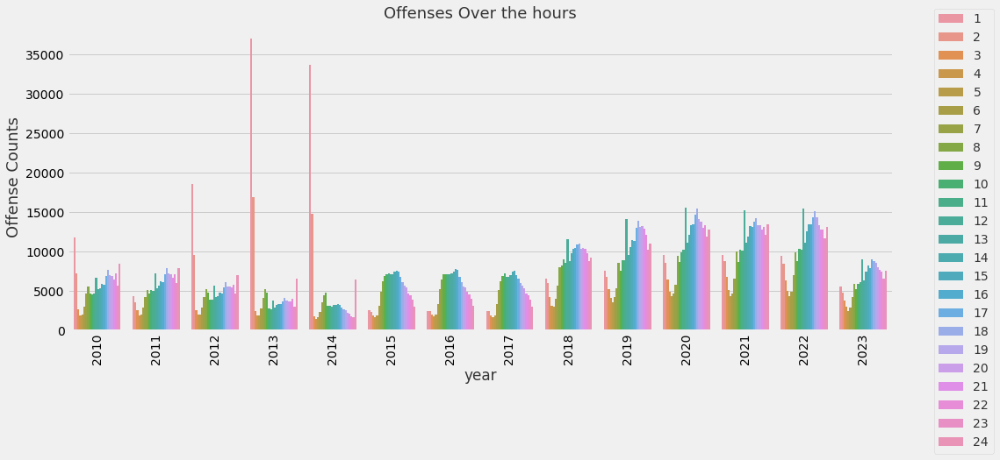

In [119]:
plt.close()
plt.figure(figsize=(15,6))
sns.barplot(x = "year", y = "Offense Count", data = C_hr,hue="occurence_hour");
#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses Over the hours",fontsize=18);
#plt.xticks(fontsize=12);
plt.xticks(rotation = 90);
plt.legend(bbox_to_anchor=(1.05, 1.05), loc='upper left', borderaxespad=0);

## Crime on weekends

In [147]:

weekdata = {
  "day": ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', "Sat","Sat"],
  "weekend": [0,0,0,0,0,1,1]
}

#load data into a DataFrame object:
weekdf = pd.DataFrame(weekdata)

weekdf

,day,weekend
0,Mon,0
1,Tue,0
2,Wed,0
3,Thu,0
4,Fri,0
5,Sat,1
6,Sat,1


In [151]:
Daily_offense=Daily_offense.merge(weekdf, on="day")
Daily_offense.head(30)

,season,mon-year,day,month,month_num,year,day_num,Offense Count,Week,isweekend,weekend_x,weekend_y,weekend
0,Winter,Jan 2010,Mon,Jan,1,2010,1,1468.0,Weekend,0,0,0,0
1,Winter,Feb 2010,Mon,Feb,2,2010,1,1391.0,Weekend,0,0,0,0
2,Spring,Mar 2010,Mon,Mar,3,2010,1,2008.0,Weekend,0,0,0,0
3,Spring,Apr 2010,Mon,Apr,4,2010,1,1595.0,Weekend,0,0,0,0
4,Spring,May 2010,Mon,May,5,2010,1,2061.0,Weekend,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25,Winter,Feb 2012,Mon,Feb,2,2012,1,1196.0,Weekend,0,0,0,0
26,Spring,Mar 2012,Mon,Mar,3,2012,1,1406.0,Weekend,0,0,0,0
27,Spring,Apr 2012,Mon,Apr,4,2012,1,1758.0,Weekend,0,0,0,0
28,Spring,May 2012,Mon,May,5,2012,1,1409.0,Weekend,0,0,0,0


In [152]:
Daily_offense.drop(["Week","isweekend","weekend_x","weekend_y"],inplace=True,axis=1)

In [153]:
Daily_offense.tail(30)

,season,mon-year,day,month,month_num,year,day_num,Offense Count,weekend
2089,Spring,Apr 2023,Sat,Apr,4,2023,6,3790.0,1
2090,Spring,Apr 2023,Sat,Apr,4,2023,6,3790.0,1
2091,Spring,Apr 2023,Sat,Apr,4,2023,6,3790.0,1
2092,Spring,Apr 2023,Sat,Apr,4,2023,6,3790.0,1
2093,Spring,Apr 2023,Sat,Apr,4,2023,6,3790.0,1
...,...,...,...,...,...,...,...,...,...
2114,Summer,Jul 2023,Sat,Jul,7,2023,6,3769.0,1
2115,Summer,Jul 2023,Sat,Jul,7,2023,6,3769.0,1
2116,Summer,Jul 2023,Sat,Jul,7,2023,6,3769.0,1
2117,Summer,Jul 2023,Sat,Jul,7,2023,6,3769.0,1


In [155]:
# Check the ratio of offense count by weekend/weekday
weekend_crime = Daily_offense[Daily_offense['weekend'] == 1]
weekday_crime = Daily_offense[Daily_offense['weekend'] == 0]

weekend_ratio = sum(weekend_crime['Offense Count']) / sum(Daily_offense['Offense Count'])*100  
weekday_ratio = sum(weekday_crime['Offense Count']) / sum(Daily_offense['Offense Count'])*100  

print(f"weekend_ratio: {weekend_ratio:.2f}%, weekday_ratio: {weekday_ratio:.2f}%")

weekend_ratio: 61.43%, weekday_ratio: 38.57%


In [161]:
weekendoffense=Daily_offense.groupby(["weekend"])["Offense Count"].sum()
weekendoffense

weekend
0    1700076.0
1    2707264.0
Name: Offense Count, dtype: float64

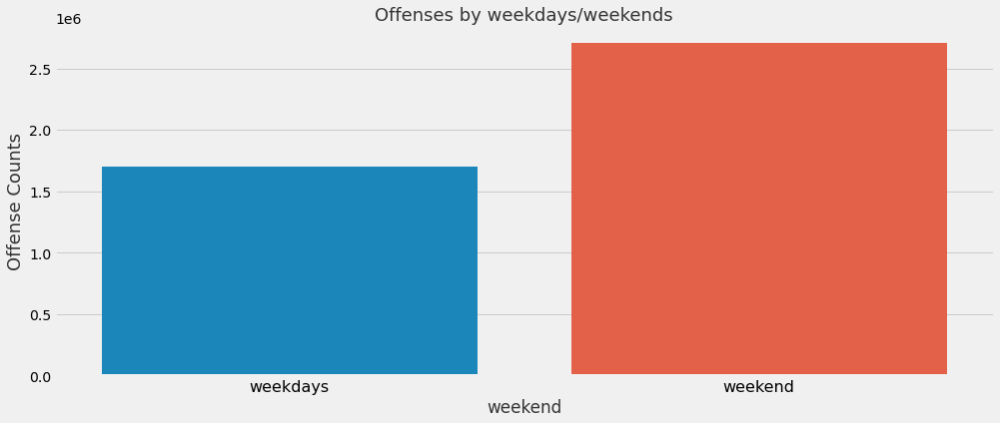

In [166]:
plt.close()
plt.figure(figsize=(15,6))
show_values_on_bars(sns.barplot(x = weekendoffense.index, y = weekendoffense, data =Daily_offense));

plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offenses by weekdays/weekends",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
labels=[]
plt.xticks(weekendoffense.index,labels=["weekdays","weekends"],fontsize=16);

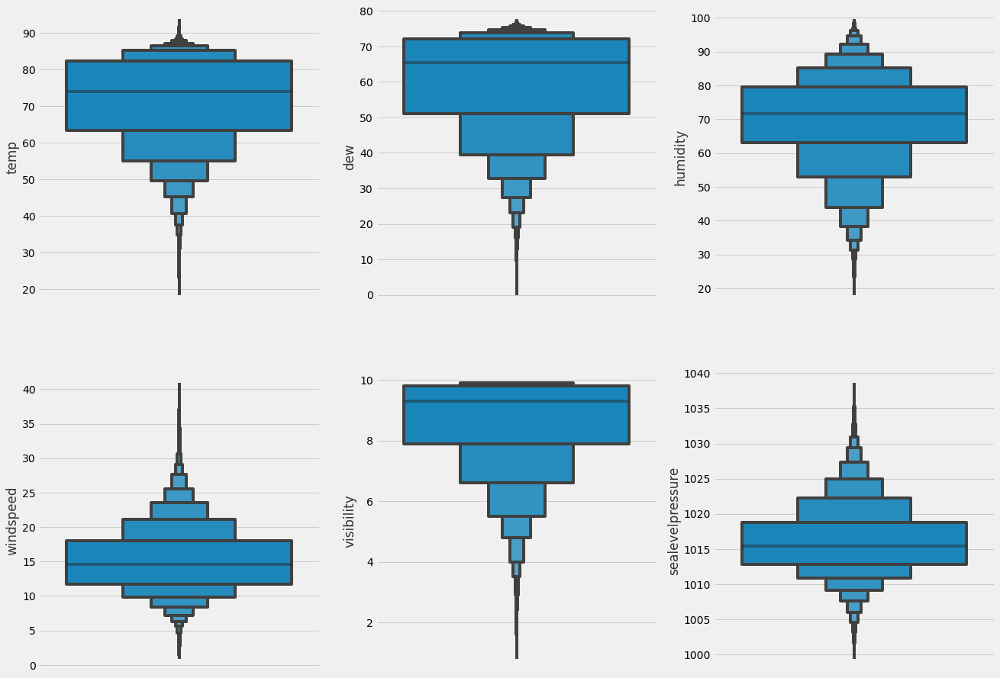

In [188]:
# Display of box charts
plt.figure(figsize = (20, 15))

plt.subplot(231)
sns.boxenplot(data = filtered_data, y = 'temp')

plt.subplot(232)
sns.boxenplot(data = filtered_data, y = 'dew')

plt.subplot(233)
sns.boxenplot(data = filtered_data, y = 'humidity')

plt.subplot(234)
sns.boxenplot(data =filtered_data, y = 'windspeed')

plt.subplot(235)
sns.boxenplot(data = filtered_data, y = 'visibility')

plt.subplot(236)
sns.boxenplot(data = filtered_data, y = 'sealevelpressure')

plt.show()

In [186]:
d=filtered_data.groupby('Offense Category')["Offense Count"].sum().sort_values(ascending=False).head(10)
                                                                                          
    

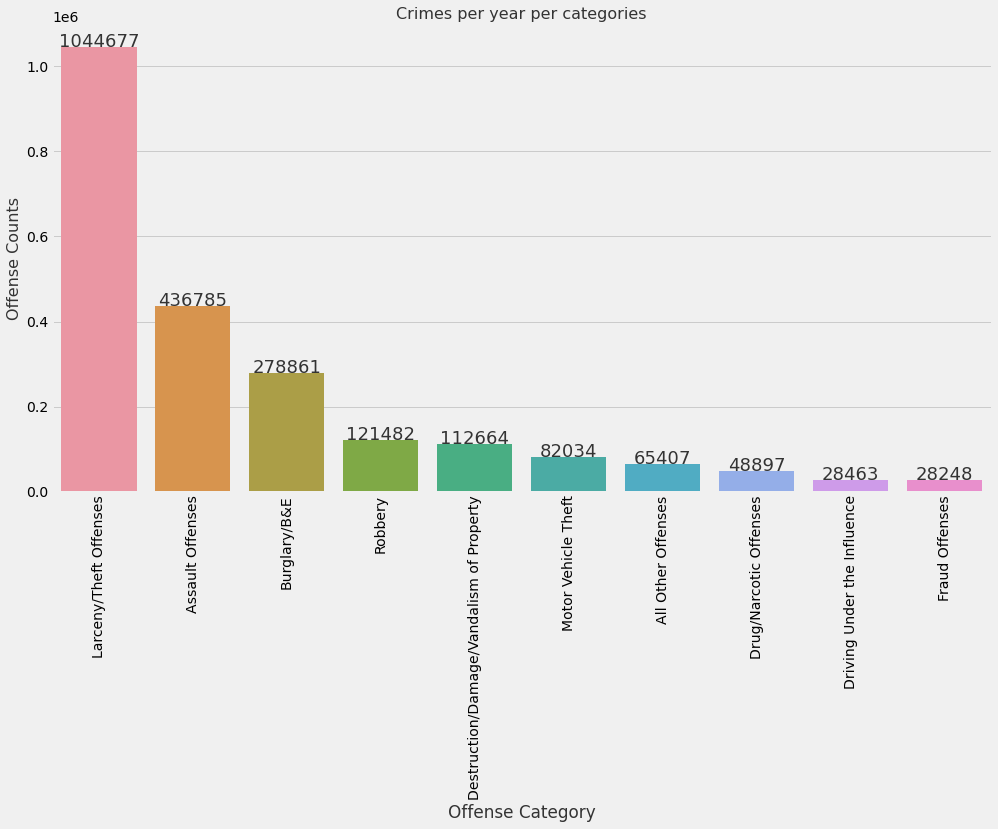

In [187]:
plt.figure(figsize=(15,8))
show_values_on_bars(sns.barplot(x=d.index,y=d));
#pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16);
plt.xticks(rotation = 90)
plt.title("Crimes per year per categories",fontsize=16); 

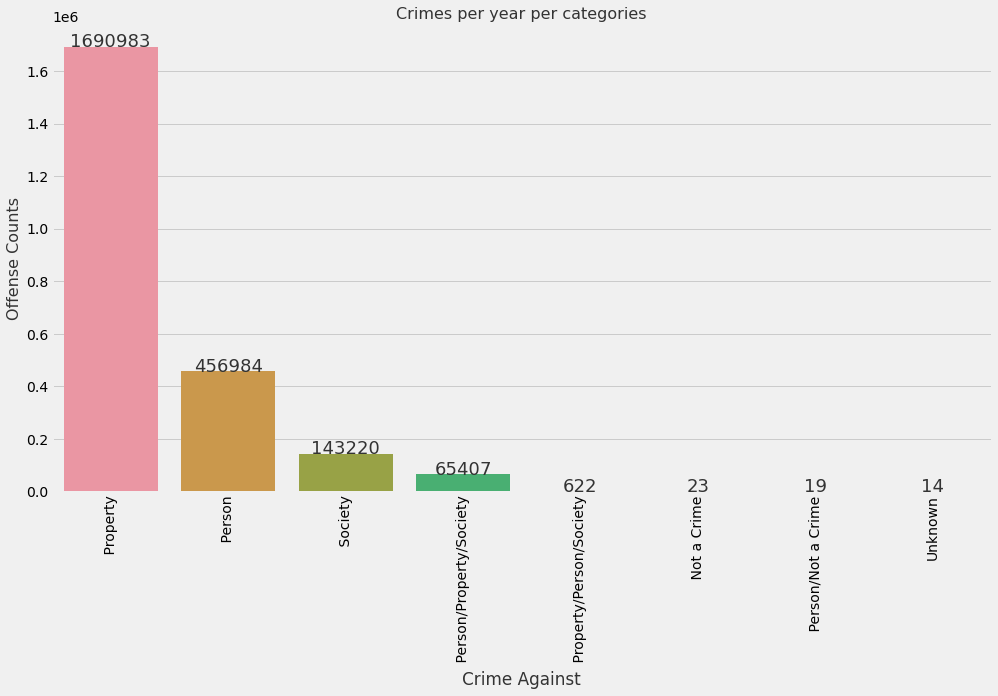

In [185]:
d=filtered_data.groupby('Crime Against')["Offense Count"].sum().sort_values(ascending=False).head(10)
plt.close()
plt.figure(figsize=(15,8))
show_values_on_bars(sns.barplot(x=d.index,y=d));
#pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16);
plt.xticks(rotation = 90)
plt.title("Crimes per year per categories",fontsize=16); 


## splitting filtered data

In [236]:
# Divide Data into 2 parts before jun2018 and afterjun2018
filtered_data["Date"]=pd.to_datetime(filtered_data["Date"])
f_before = filtered_data.loc[filtered_data["Date"] <= "2018-05-31"]
f_after = filtered_data.loc[filtered_data["Date"] >="2018-06-01"]
f_after.shape

(1256390, 38)

In [237]:
p=f_after.groupby(["year",'Offense Category'])["Offense Count"].sum().sort_values(ascending=False).reset_index()
p=p.sort_values(["year","Offense Count"])
p.head(30)

,year,Offense Category,Offense Count
184,2018,Human Trafficking,3.0
185,2018,Runaway,3.0
181,2018,Bribery,4.0
173,2018,Gambling Offenses,10.0
172,2018,Curfew/Loitering/Vagrancy Violations,11.0
...,...,...,...
57,2018,Fraud Offenses,4293.0
52,2018,Robbery,5170.0
48,2018,Drug/Narcotic Offenses,6040.0
41,2018,Motor Vehicle Theft,7569.0


In [238]:
pivot=pd.pivot_table(p,index="year",values="Offense Count", columns="Offense Category", aggfunc=np.mean)

<Figure size 1080x2160 with 0 Axes>

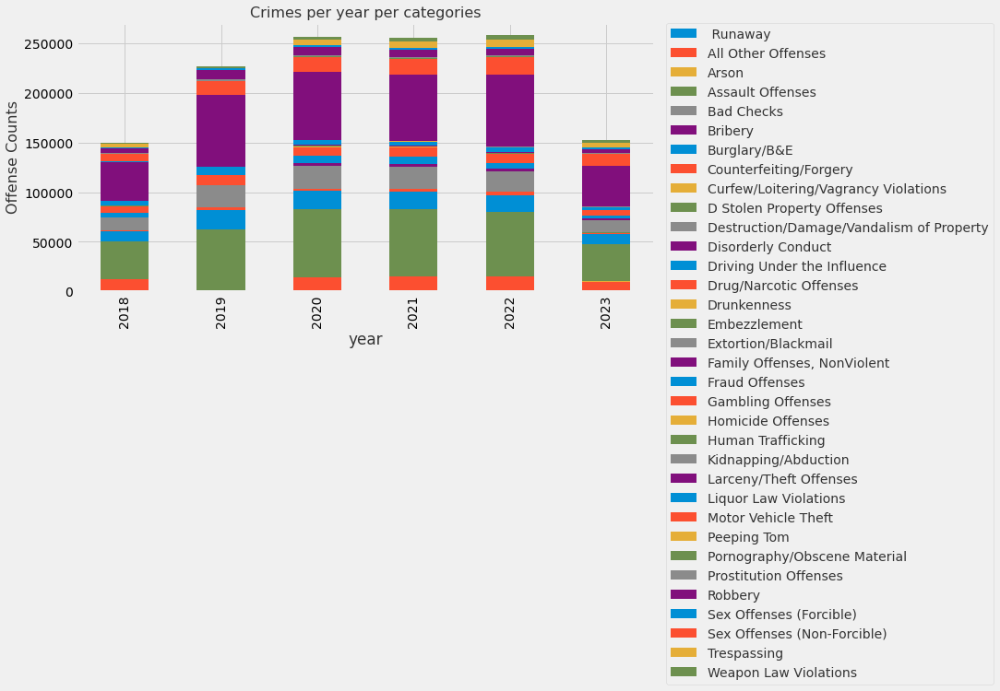

In [239]:
plt.close()
plt.figure(figsize=(15,30))

pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16)

plt.title("Crimes per year per categories",fontsize=16)
#plt.legend(loc='outer right')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [240]:
g=f_after.groupby(["year",'Crime Against'])["Offense Count"].sum().sort_values(ascending=False).reset_index()
g=g.sort_values(["year","Offense Count"])
g.head(30)

,year,Crime Against,Offense Count
33,2018,Not a Crime,3.0
28,2018,Property/Person/Society,61.0
21,2018,Person/Property/Society,12010.0
16,2018,Society,17564.0
10,2018,Person,39346.0
...,...,...,...
23,2022,Property/Person/Society,160.0
17,2022,Person/Property/Society,15063.0
13,2022,Society,31501.0
8,2022,Person,66643.0


In [241]:
pivot=pd.pivot_table(g,index="year",values="Offense Count", columns="Crime Against", aggfunc=np.mean)

<Figure size 1080x2160 with 0 Axes>

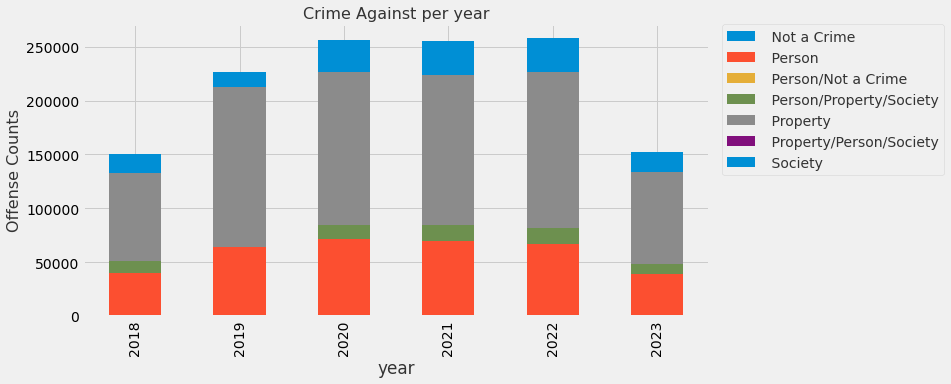

In [242]:
plt.close()
plt.figure(figsize=(15,30))

pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16)

plt.title("Crime Against per year",fontsize=16)
#plt.legend(loc='outer right')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [243]:
f_after.columns

Index(['Date', 'Offense Count', 'NIBRS Description', 'Offense Code',
       'Crime Against', 'Offense Category', 'tempmax', 'tempmin', 'temp',
       'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity',
       'precip', 'precipcover', 'preciptype', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'moonphase', 'conditions',
       'Daylight(hr)', 'year', 'month', 'day', 'mon-year', 'month_num',
       'day_num', 'season', 'occurence_hour'],
      dtype='object')

In [244]:
s=f_after.groupby(["year",'season'])["Offense Count"].sum().sort_values(ascending=False).reset_index()
s=s.sort_values(["year","Offense Count"])
s.head(30)

,year,season,Offense Count
21,2018,Winter,21025.0
11,2018,Autumn,62924.0
3,2018,Summer,66397.0
18,2019,Winter,53214.0
17,2019,Spring,57222.0
...,...,...,...
1,2022,Summer,67817.0
0,2022,Spring,68040.0
20,2023,Winter,41938.0
19,2023,Summer,43553.0


In [245]:
pivot=pd.pivot_table(s,index="year",values="Offense Count", columns="season", aggfunc=np.mean)

<Figure size 1080x2160 with 0 Axes>

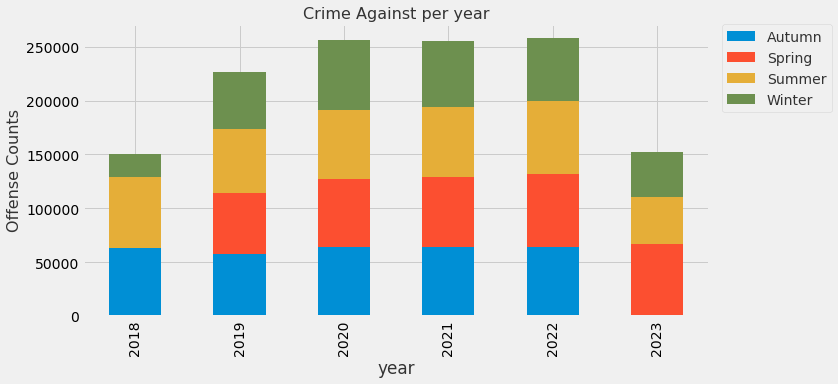

In [246]:
plt.close()
plt.figure(figsize=(15,30))

pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16)

plt.title("Crime Against per year",fontsize=16)
#plt.legend(loc='outer right')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [247]:
c=f_after.groupby(["year",'conditions'])["Offense Count"].sum().sort_values(ascending=False).reset_index()
c=c.sort_values(["year","Offense Count"])
c.head(30)

,year,conditions,Offense Count
36,2018,Rain,743.0
30,2018,Overcast,2684.0
26,2018,"Rain, Overcast",9242.0
19,2018,Clear,19954.0
10,2018,Partially cloudy,56771.0
...,...,...,...
2,2021,Partially cloudy,99016.0
37,2022,"Snow, Rain, Overcast",563.0
35,2022,Rain,768.0
24,2022,Overcast,12877.0


In [248]:
pivot=pd.pivot_table(c,index="year",values="Offense Count", columns="conditions", aggfunc=np.mean)

<Figure size 1080x2160 with 0 Axes>

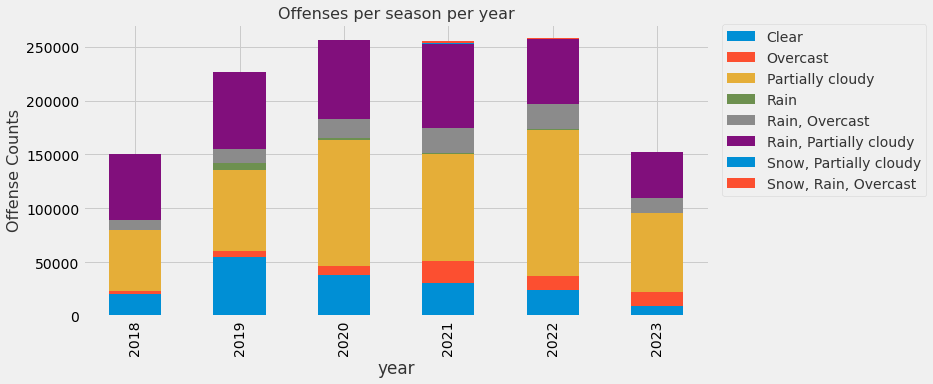

In [249]:
plt.close()
plt.figure(figsize=(15,30))

pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16)

plt.title("Offenses per season per year",fontsize=16)
#plt.legend(loc='outer right')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

<Figure size 1080x2160 with 0 Axes>

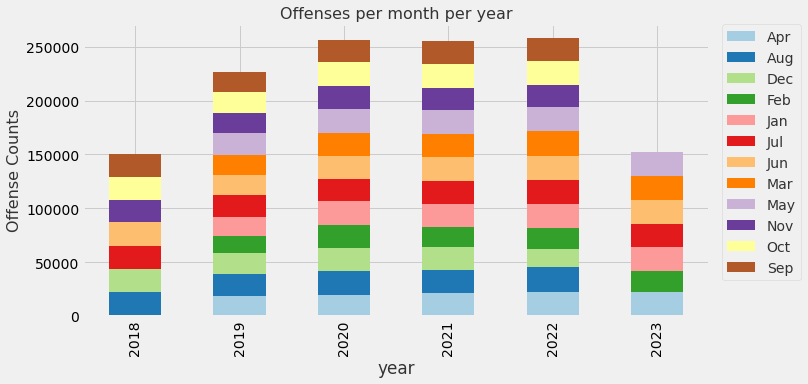

In [255]:
m=f_after.groupby(["year",'month'])["Offense Count"].sum().sort_values(ascending=False).reset_index()
m=m.sort_values(["year","Offense Count"])
# s.head(30)
pivot=pd.pivot_table(m,index="year",values="Offense Count", columns="month", aggfunc=np.mean)

plt.close()
plt.figure(figsize=(15,30))

custom_palette = sns.color_palette("Paired", 12)

pivot.plot(kind='bar', stacked=True,color=custom_palette)
#pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16)

plt.title("Offenses per month per year",fontsize=16)
#plt.legend(loc='outer right')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

<Figure size 1080x2160 with 0 Axes>

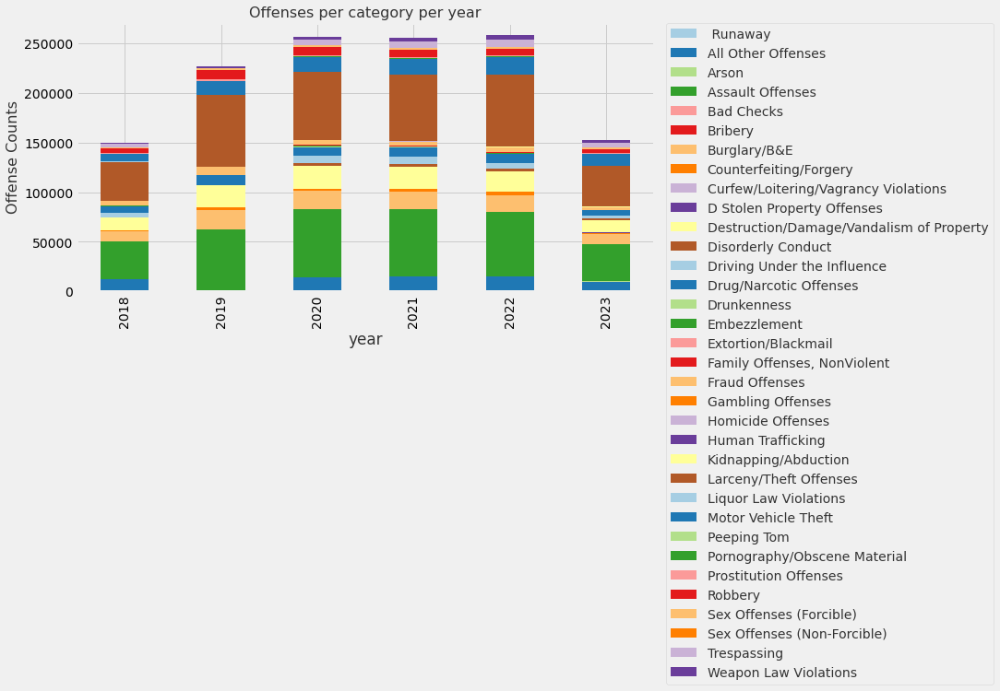

In [260]:
o=f_after.groupby(["year",'Offense Category'])["Offense Count"].sum().sort_values(ascending=False).reset_index()
o=o.sort_values(["year","Offense Count"])
# s.head(30)
pivot=pd.pivot_table(o,index="year",values="Offense Count", columns="Offense Category", aggfunc=np.mean)

plt.close()
plt.figure(figsize=(15,30))

custom_palette = sns.color_palette("Paired", 35)

pivot.plot(kind='bar', stacked=True,color=custom_palette)
#pivot.plot(kind='bar', stacked=True)
plt.ylabel("Offense Counts",fontsize=16)

plt.title("Offenses per category per year",fontsize=16)
#plt.legend(loc='outer right')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [332]:
filtered_data.to_csv("HCWOutlierfree.csv",index=False)

In [298]:
filtered_data.columns

Index(['Date', 'Offense Count', 'NIBRS Description', 'Offense Code',
       'Crime Against', 'Offense Category', 'tempmax', 'tempmin', 'temp',
       'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity',
       'precip', 'precipcover', 'preciptype', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'moonphase', 'conditions',
       'Daylight(hr)', 'year', 'month', 'day', 'mon-year', 'month_num',
       'day_num', 'season', 'occurence_hour'],
      dtype='object')

## Aggregated and Split Data

The Offense counts was given in hourly basis so aggregated with sum of the day, however weather data is already on daily  bases and provided with mean values, so i aggregate them seperately and merged together by Date

In [331]:
Date_agg=filtered_data.groupby('Date')[['Offense Count']].sum().sort_values('Date',ascending=True).reset_index()
#crime_agg= crime_agg.sort_values('Date')
Date_agg.shape

(4960, 2)

In [333]:
Category_agg=filtered_data.groupby('Date')[['Crime Against', 'Offense Category','conditions','season']].nunique().sort_values('Date',ascending=True).reset_index()
#crime_agg= crime_agg.sort_values('Date')
Category_agg.head()

,Date,Crime Against,Offense Category,conditions,season
0,2010-01-01,2,6,1,1
1,2010-01-02,2,5,1,1
2,2010-01-03,2,4,1,1
3,2010-01-04,2,5,1,1
4,2010-01-05,2,6,1,1


In [334]:
weather_agg=filtered_data.groupby('Date')[['tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipcover',
       'snowdepth', 'windgust', 'windspeed', 'winddir', 'sealevelpressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'moonphase', 'Daylight(hr)']].mean().sort_values('Date',ascending=True).reset_index()
#crime_agg= crime_agg.sort_values('Date')
weather_agg.head()

,Date,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,moonphase,Daylight(hr)
0,2010-01-01,53.9,41.3,46.9,53.9,33.0,42.3,34.0,63.0,0.000,...,18.0,359.3,1028.0,47.7,9.8,174.8,15.0,7.0,0.53,10.273611
1,2010-01-02,48.4,38.5,44.0,45.8,33.6,40.3,40.3,87.0,0.011,...,8.3,58.8,1018.7,79.9,3.7,86.5,7.4,4.0,0.58,10.795833
2,2010-01-03,58.9,46.6,53.4,58.9,38.7,52.2,48.8,84.6,0.645,...,22.4,17.1,1008.9,96.6,7.3,179.6,15.5,8.0,0.53,11.560556
3,2010-01-04,73.6,61.0,66.8,73.6,61.0,66.8,59.0,77.0,0.000,...,19.7,148.7,1013.5,71.7,8.8,296.8,25.9,10.0,0.58,12.488889
4,2010-01-05,83.3,73.5,77.9,89.2,73.5,79.9,72.6,84.4,0.000,...,17.5,155.6,999.4,86.4,5.6,307.1,26.5,10.0,0.60,13.327222


In [335]:
## merge all the aggreagates by date
Data_agg=Date_agg.merge(Category_agg,on='Date')

Data_agg.head()

,Date,Offense Count,Crime Against,Offense Category,conditions,season
0,2010-01-01,416.0,2,6,1,1
1,2010-01-02,347.0,2,5,1,1
2,2010-01-03,340.0,2,4,1,1
3,2010-01-04,386.0,2,5,1,1
4,2010-01-05,339.0,2,6,1,1


In [336]:
Data_agg=Data_agg.merge(weather_agg,on='Date')
Data_agg.head()

,Date,Offense Count,Crime Against,Offense Category,conditions,season,tempmax,tempmin,temp,feelslikemax,...,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,moonphase,Daylight(hr)
0,2010-01-01,416.0,2,6,1,1,53.9,41.3,46.9,53.9,...,18.0,359.3,1028.0,47.7,9.8,174.8,15.0,7.0,0.53,10.273611
1,2010-01-02,347.0,2,5,1,1,48.4,38.5,44.0,45.8,...,8.3,58.8,1018.7,79.9,3.7,86.5,7.4,4.0,0.58,10.795833
2,2010-01-03,340.0,2,4,1,1,58.9,46.6,53.4,58.9,...,22.4,17.1,1008.9,96.6,7.3,179.6,15.5,8.0,0.53,11.560556
3,2010-01-04,386.0,2,5,1,1,73.6,61.0,66.8,73.6,...,19.7,148.7,1013.5,71.7,8.8,296.8,25.9,10.0,0.58,12.488889
4,2010-01-05,339.0,2,6,1,1,83.3,73.5,77.9,89.2,...,17.5,155.6,999.4,86.4,5.6,307.1,26.5,10.0,0.60,13.327222


In [337]:
Data_agg.shape

(4960, 28)

In [304]:
Data_agg.columns

Index(['Date', 'Offense Count', 'Crime Against', 'Offense Category',
       'conditions', 'season', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipcover',
       'snowdepth', 'windgust', 'windspeed', 'winddir', 'sealevelpressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'moonphase', 'Daylight(hr)'],
      dtype='object')

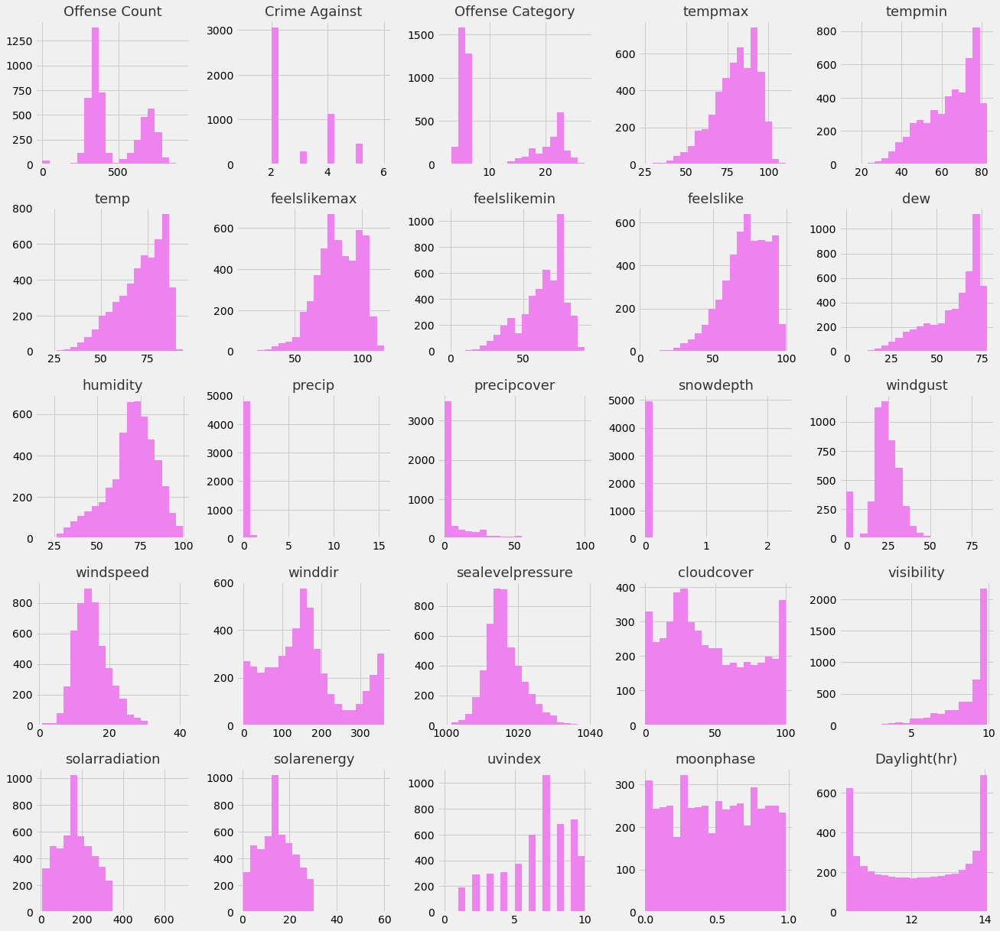

In [204]:
data=Data_agg[['Offense Count', 'Crime Against', 'Offense Category','conditions', 'season', 'tempmax',
       'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike', 'dew',
       'humidity', 'precip', 'precipcover', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'moonphase',
       'Daylight(hr)']]
data.hist(bins = 20, figsize = (20, 20), color = 'violet');

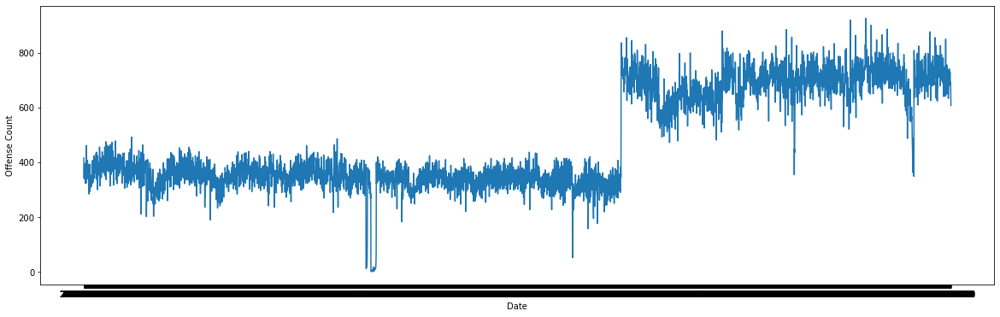

In [59]:
plt.close()
plt.figure(figsize=(20,6))
sns.lineplot(x="Date",y="Offense Count",data=Data_agg);
#plt.grid()
plt.show()

In [321]:
filtered_data.shape

(2307150, 38)

# Plotting Multivariate Data

## spliting Aggregating Data

In [338]:
# Divide Data into 2 parts before jun2018 and afterjun2018
Data_agg["Date"]=pd.to_datetime(Data_agg["Date"])
cw_before = Data_agg.loc[Data_agg["Date"] <= "2018-05-31"]
cw_after = Data_agg.loc[Data_agg["Date"] >="2018-06-01"]

In [339]:
cw_after.head()

,Date,Offense Count,Crime Against,Offense Category,conditions,season,tempmax,tempmin,temp,feelslikemax,...,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,moonphase,Daylight(hr)
3073,2018-06-01,836.0,5,25,1,1,94.0,75.8,84.6,104.2,...,13.5,171.5,1012.4,39.5,9.2,78.8,6.9,5.0,0.60,13.934167
3074,2018-06-02,720.0,5,20,1,1,94.2,76.6,84.6,105.3,...,12.0,197.9,1012.8,49.9,9.4,87.6,7.7,4.0,0.64,13.946111
3075,2018-06-03,716.0,4,23,1,1,96.2,75.2,84.2,103.4,...,15.0,217.6,1015.6,53.8,9.7,200.2,17.3,9.0,0.67,13.957500
3076,2018-06-04,726.0,5,23,1,1,92.0,74.6,82.7,101.7,...,12.8,179.3,1015.0,89.4,9.9,114.8,9.7,5.0,0.70,13.968611
3077,2018-06-05,750.0,4,20,1,1,94.9,75.6,84.5,101.5,...,13.8,198.4,1011.6,52.5,9.8,298.6,25.9,8.0,0.73,13.978611


## after June 2018

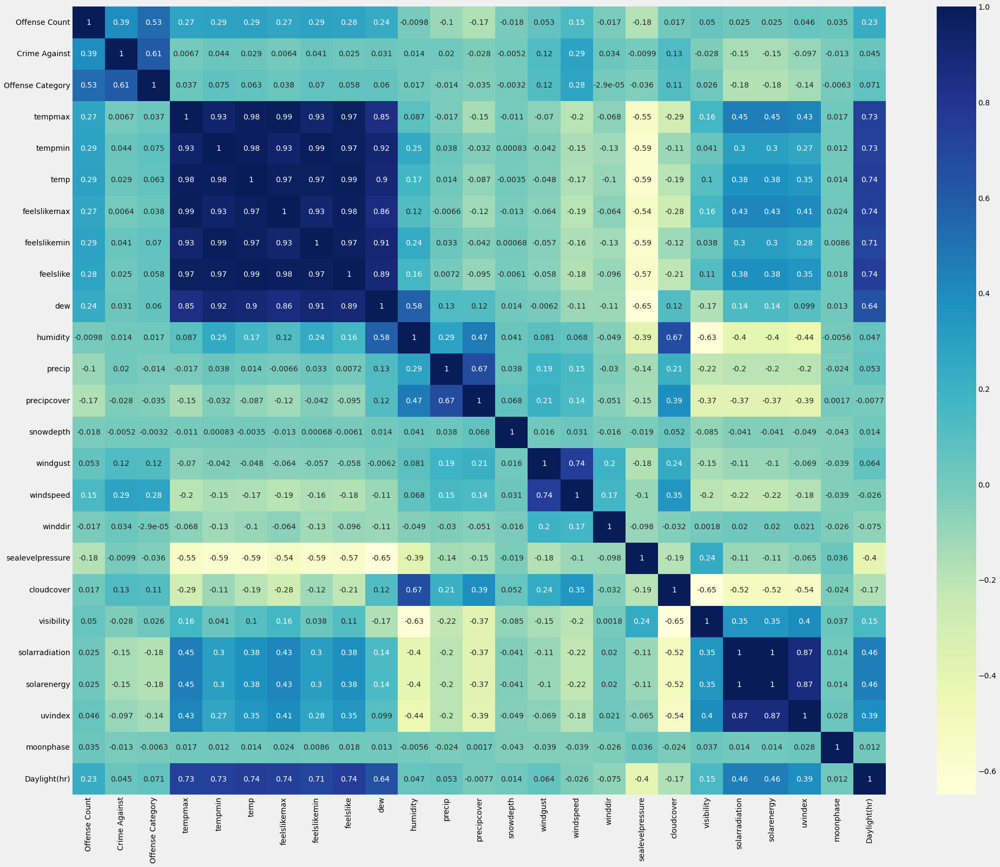

In [294]:
plt.close()
plt.figure(figsize=(30,25))
sns.heatmap(cw_after[1:].corr(),cmap="YlGnBu", annot = True);
plt.show()

## before June 2018

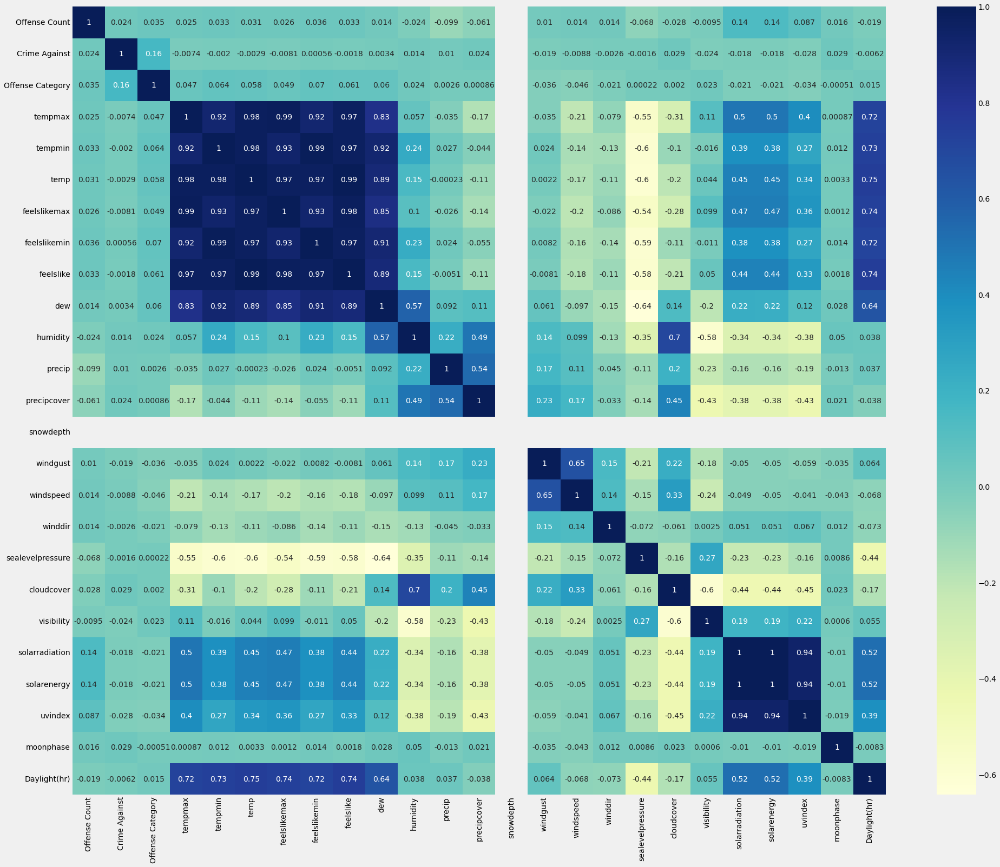

In [295]:
plt.close()
plt.figure(figsize=(30,25))
sns.heatmap(cw_before[1:].corr(),cmap="YlGnBu", annot = True);
plt.show()

## checking Year wise pattern of different variables

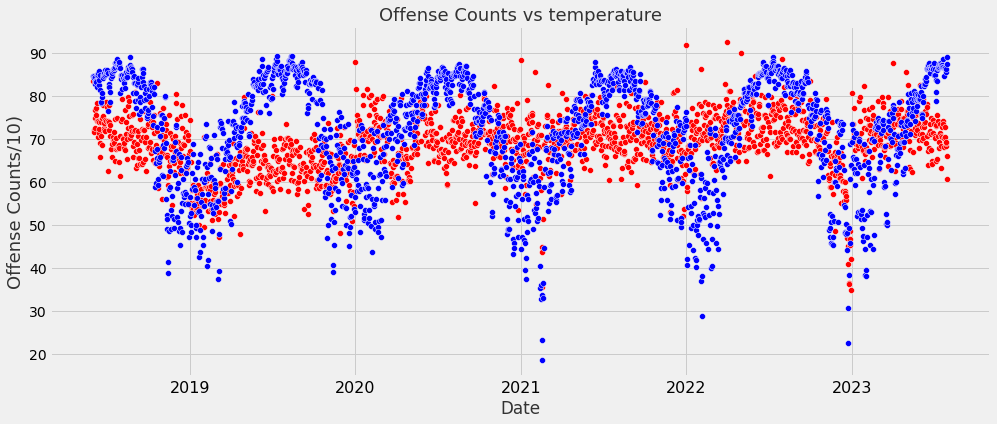

In [209]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
sns.scatterplot(x = "Date", y = "temp", data = cw_after,color='blue');
#sns.lineplot(x = "Date", y = "dew", data = cw_after,color='green');
#sns.lineplot(x = "Date", y = "humidity", data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts vs temperature",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

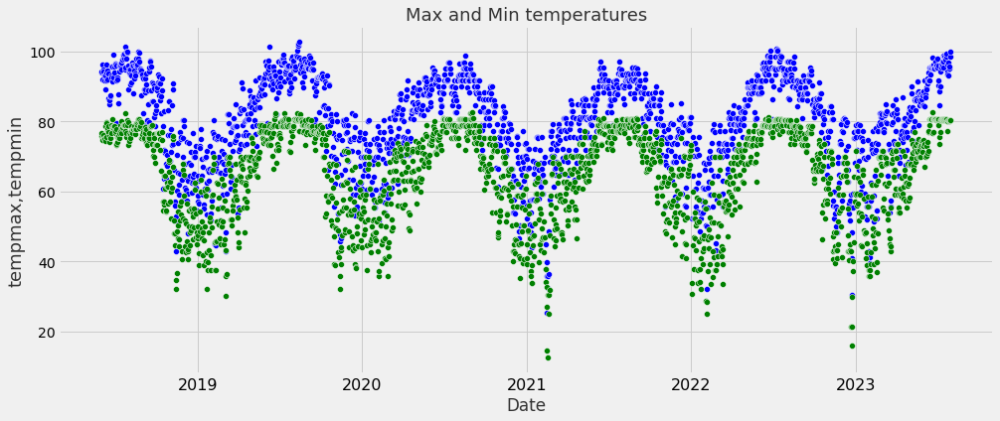

In [210]:
plt.close()
plt.figure(figsize=(15,6))
#sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
sns.scatterplot(x = "Date", y = "tempmax", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y = "tempmin", data = cw_after,color='green');
#sns.lineplot(x = "Date", y = "humidity", data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("tempmax,tempmin",fontsize=18);
plt.title("Max and Min temperatures",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

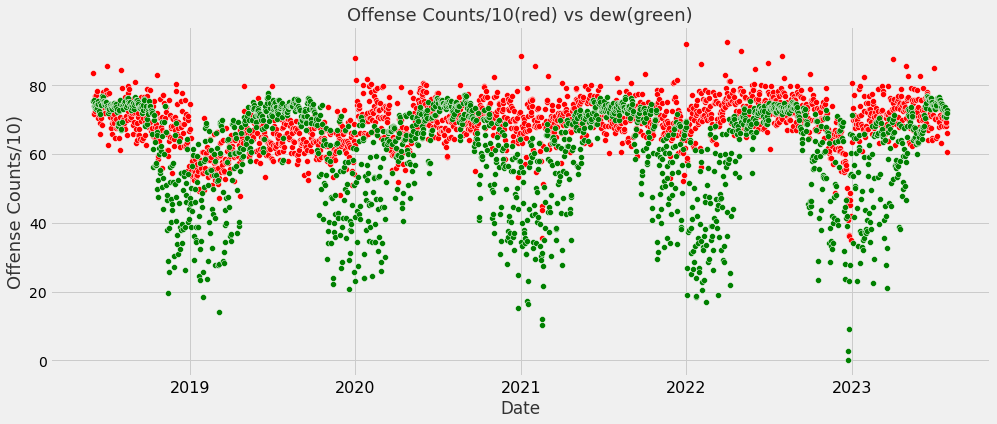

In [271]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
#sns.lineplot(x = "Date", y = "temp", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y = "dew", data = cw_after,color='green');
#sns.lineplot(x = "Date", y = "humidity", data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts/10(red) vs dew(green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

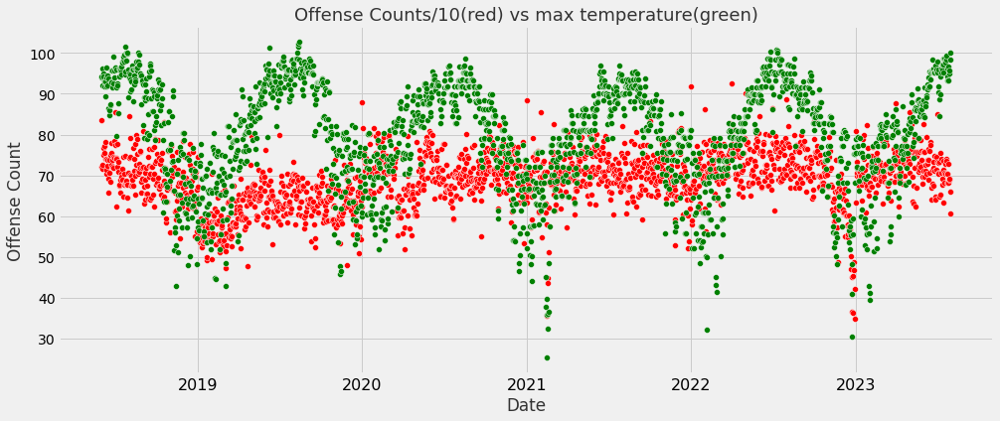

In [270]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
#sns.lineplot(x = "Date", y = "temp", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y = "tempmax", data = cw_after,color='green');
#sns.lineplot(x = "Date", y = "humidity", data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts/10(red) vs max temperature(green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

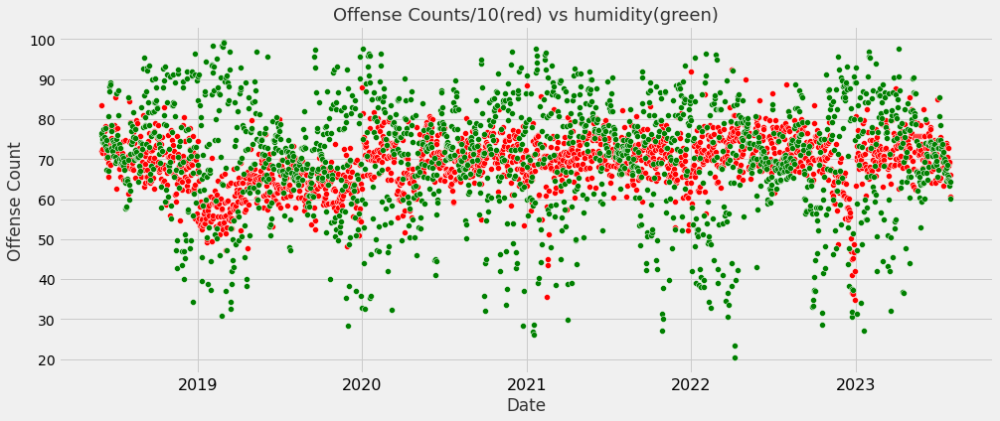

In [269]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
#sns.lineplot(x = "Date", y = "temp", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y = "humidity", data = cw_after,color='green');

#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts/10(red) vs humidity(green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

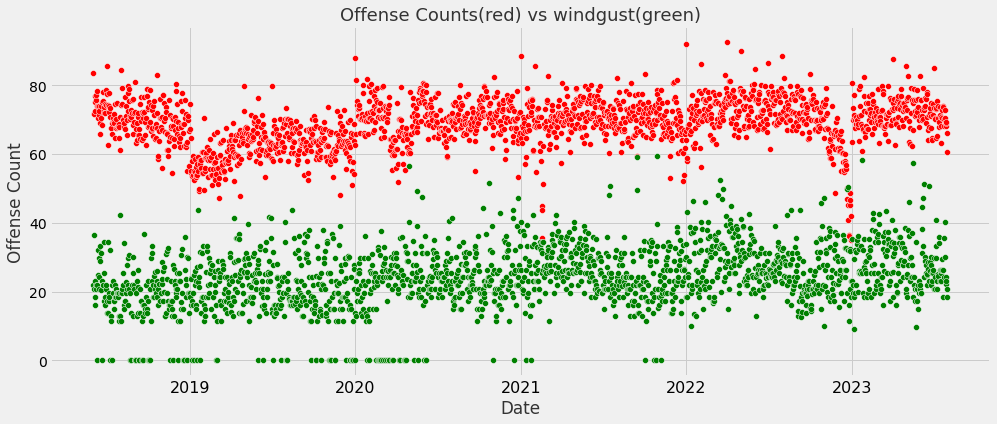

In [268]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
#sns.lineplot(x = "Date", y = "temp", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y = "windgust", data = cw_after,color='green');
#sns.lineplot(x = "Date", y = "humidity", data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts(red) vs windgust(green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

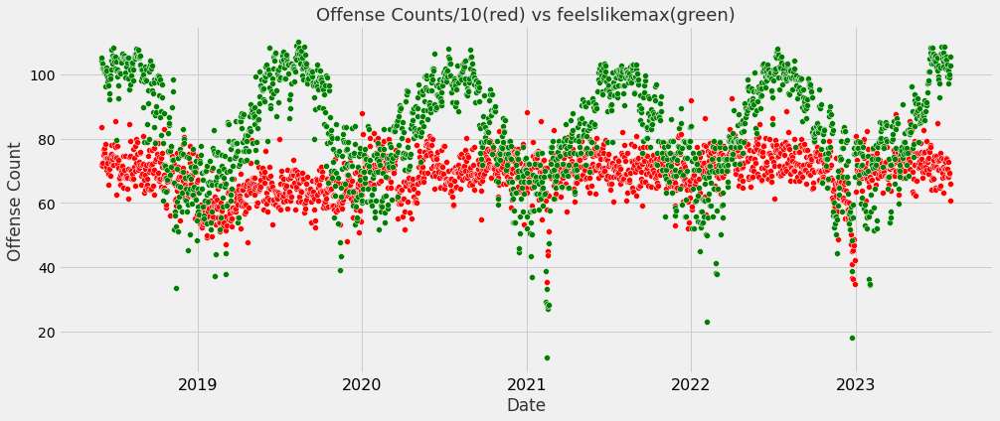

In [272]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
#sns.lineplot(x = "Date", y = "temp", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y = "feelslikemax", data = cw_after,color='green');
#sns.lineplot(x = "Date", y = "humidity", data = cw_after,color='orange');

plt.title("Offense Counts/10(red) vs feelslikemax(green)",fontsize=18);

plt.xticks(fontsize=16);


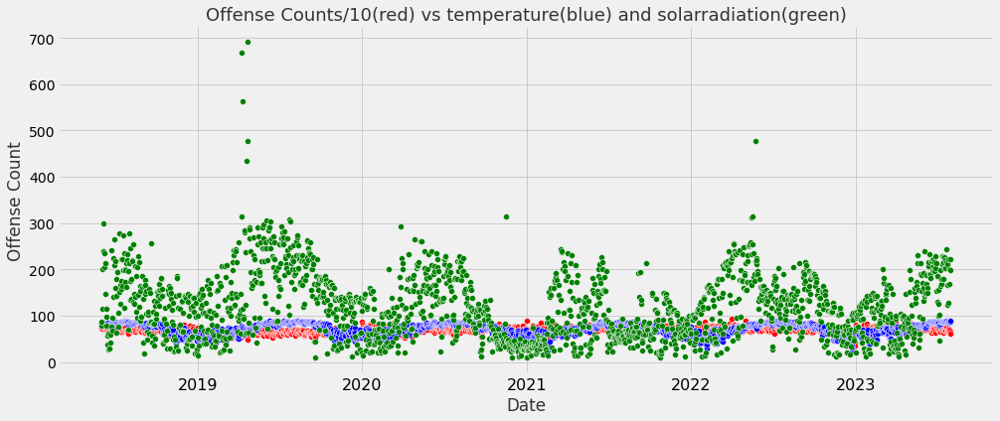

In [274]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"]/10,color='red');
sns.scatterplot(x = "Date", y = "temp", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y ='solarradiation', data = cw_after,color='green');
#sns.lineplot(x = "Date", y = "humidity", data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts/10(red) vs temperature(blue) and solarradiation(green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

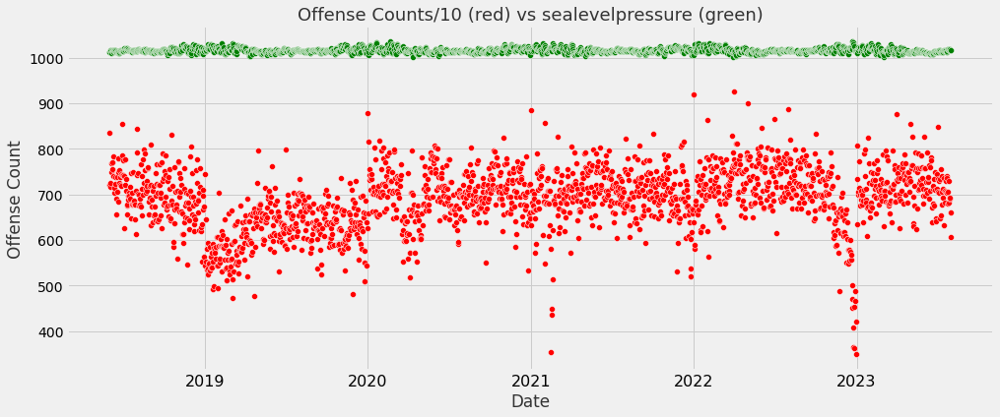

In [275]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"],color='red');
#sns.scatterplot(x = "Date", y = "moonphase", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y ='sealevelpressure', data = cw_after,color='green');
#sns.lineplot(x = "Date", y = 'sealevelpressure', data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts/10 (red) vs sealevelpressure (green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

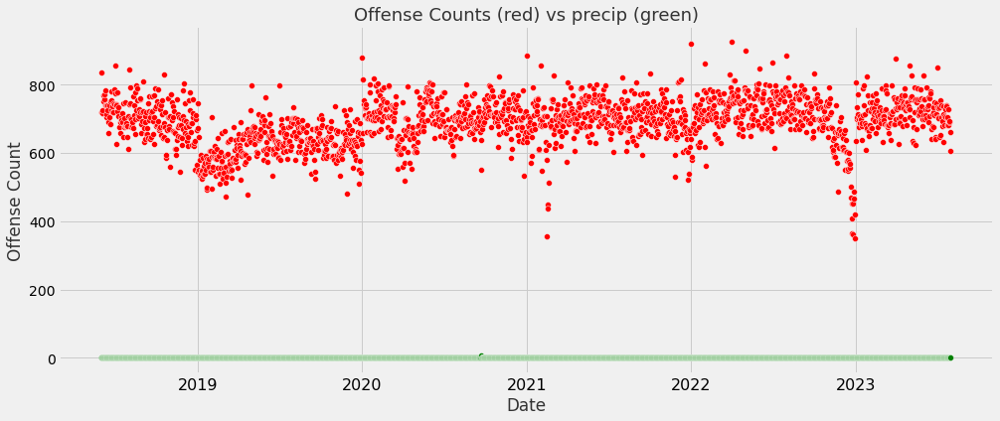

In [276]:
plt.close()
plt.figure(figsize=(15,6))
sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"],color='red');
#sns.scatterplot(x = "Date", y = "moonphase", data = cw_after,color='blue');
sns.scatterplot(x = "Date", y ='precip', data = cw_after,color='green');
#sns.lineplot(x = "Date", y = 'sealevelpressure', data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Offense Counts (red) vs precip (green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

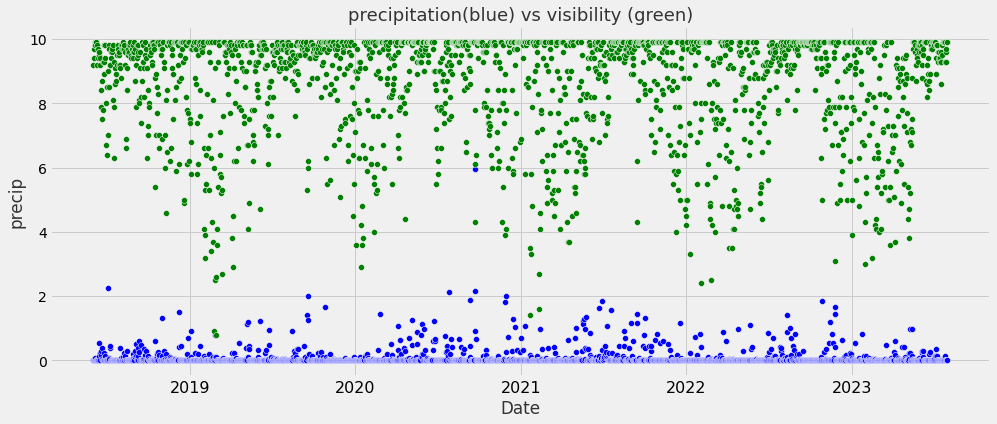

In [277]:
plt.close()
plt.figure(figsize=(15,6))
#sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"],color='red');
sns.scatterplot(x = "Date", y =  'precip', data = cw_after,color='blue');
sns.scatterplot(x = "Date", y ='visibility', data = cw_after,color='green');
#sns.lineplot(x = "Date", y = 'sealevelpressure', data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("precipitation(blue) vs visibility (green)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

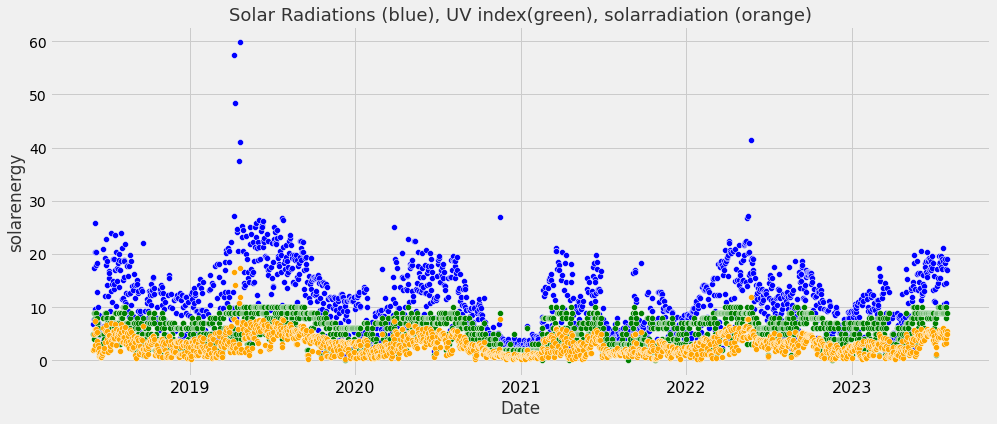

In [278]:
plt.close()
plt.figure(figsize=(15,6))
#sns.scatterplot(x = cw_after["Date"], y =cw_after["Offense Count"],color='red');
sns.scatterplot(x = "Date", y =  'solarenergy', data = cw_after,color='blue');
sns.scatterplot(x = "Date", y ='uvindex', data = cw_after,color='green');
sns.scatterplot(x = "Date", y = cw_after['solarradiation']/40, data = cw_after,color='orange');

#plt.bar(x = Y_added["year_added"], y = Y_added["title"])
#plt.ylabel("Offense Counts/10)",fontsize=18);
plt.title("Solar Radiations (blue), UV index(green), solarradiation (orange)",fontsize=18);
#plt.xlabel("months",fontsize=18)
#plt.show()
plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

## correlation between variables

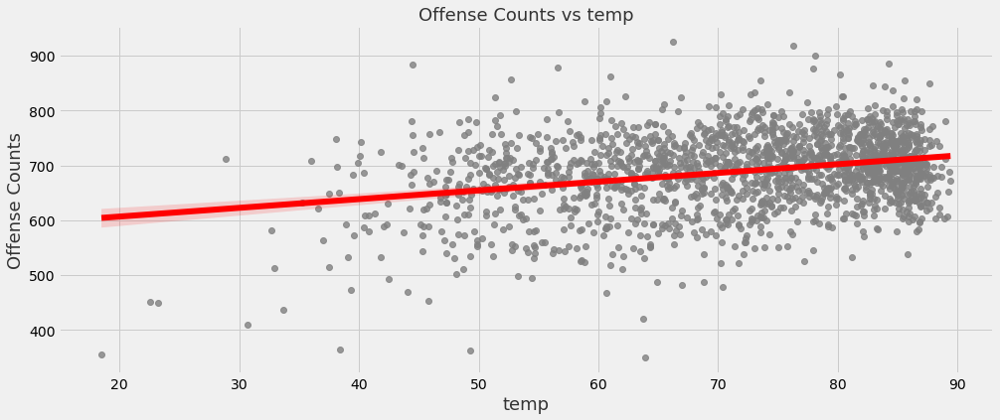

In [279]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="temp", y='Offense Count',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offense Counts vs temp",fontsize=18);
plt.xlabel("temp",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

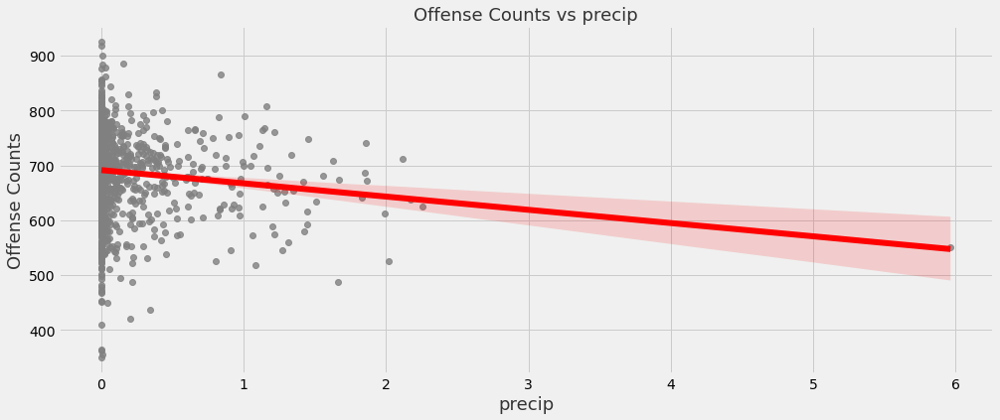

In [280]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="precip", y='Offense Count',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offense Counts vs precip",fontsize=18);
plt.xlabel("precip",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

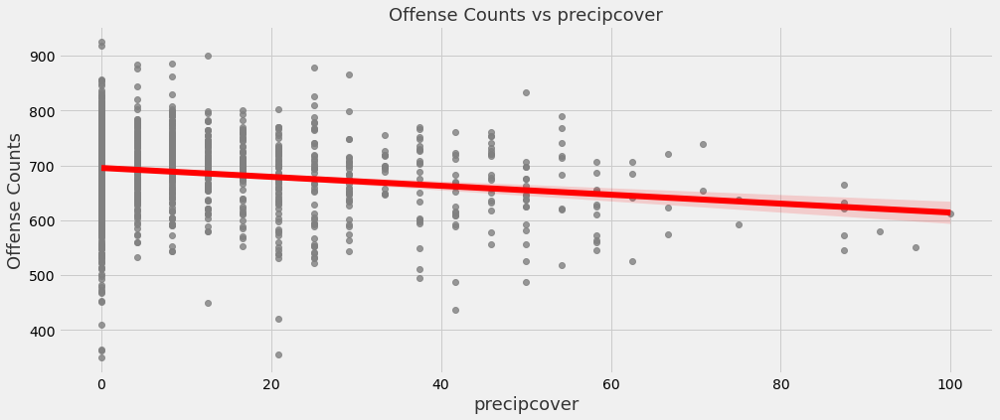

In [281]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="precipcover", y='Offense Count',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offense Counts vs precipcover",fontsize=18);
plt.xlabel("precipcover",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

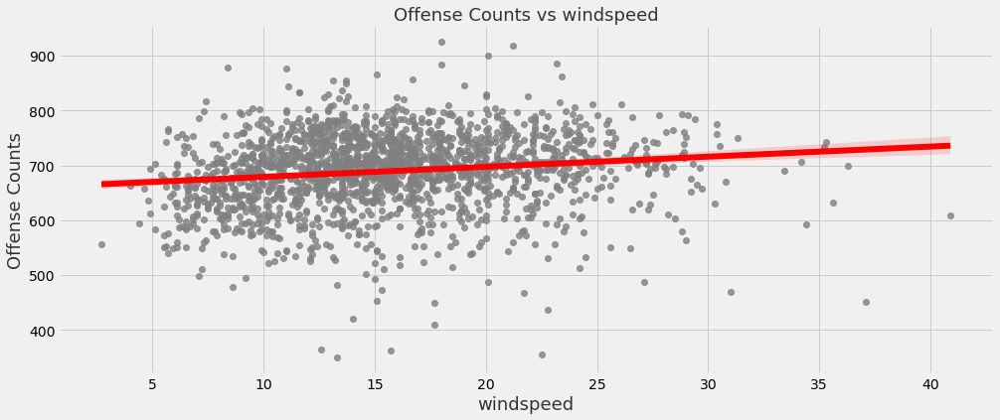

In [282]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="windspeed", y='Offense Count',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offense Counts vs windspeed",fontsize=18);
plt.xlabel("windspeed",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

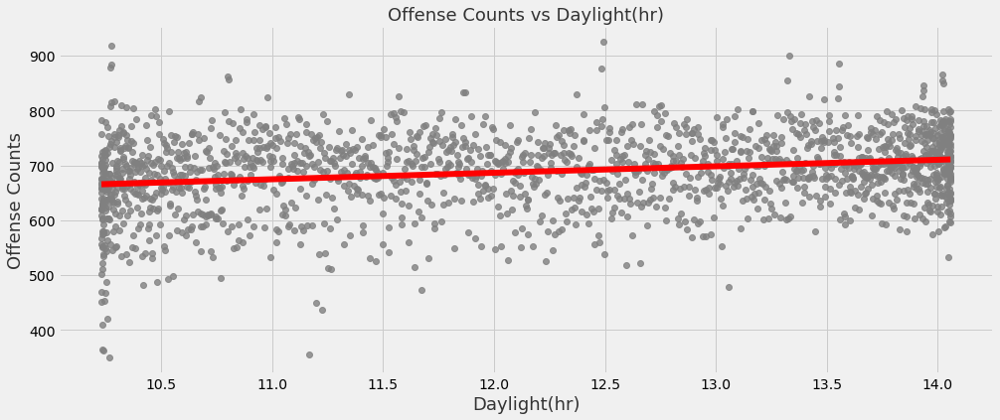

In [283]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="Daylight(hr)", y='Offense Count',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("Offense Counts",fontsize=18);
plt.title("Offense Counts vs Daylight(hr)",fontsize=18);
plt.xlabel("Daylight(hr)",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

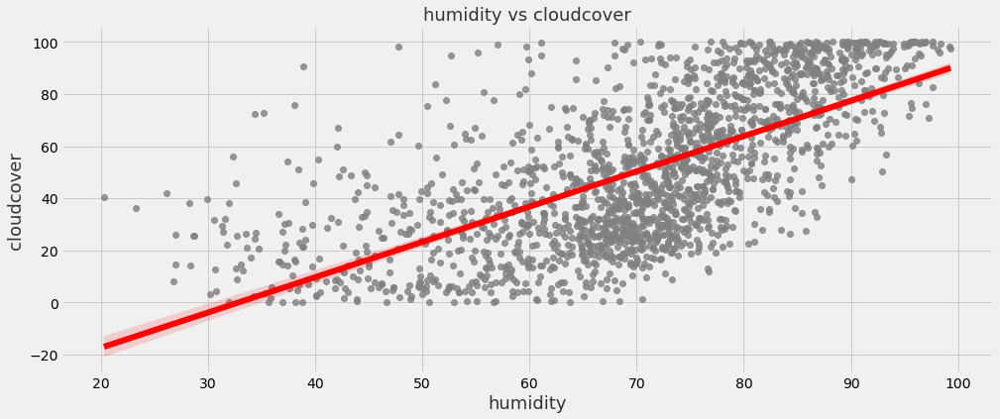

In [284]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="humidity", y='cloudcover',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("cloudcover",fontsize=18);
plt.title("humidity vs cloudcover",fontsize=18);
plt.xlabel("humidity",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

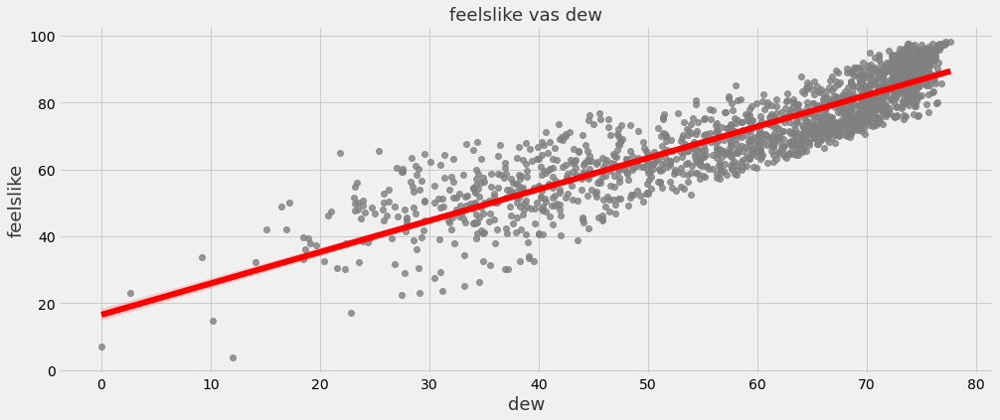

In [285]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="dew", y='feelslike',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("feelslike",fontsize=18);
plt.title("feelslike vas dew",fontsize=18);
plt.xlabel("dew",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

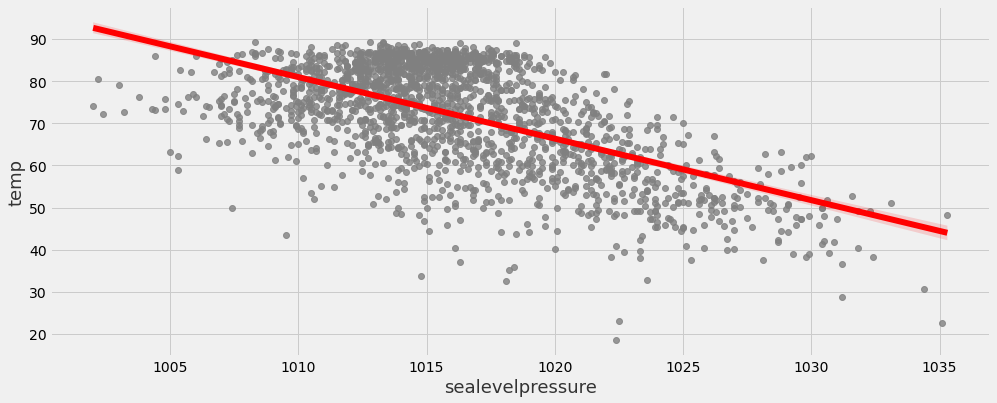

In [286]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="sealevelpressure", y='temp',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("temp",fontsize=18);
#plt.title("Offense Counts vs temperature",fontsize=18);
plt.xlabel("sealevelpressure",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

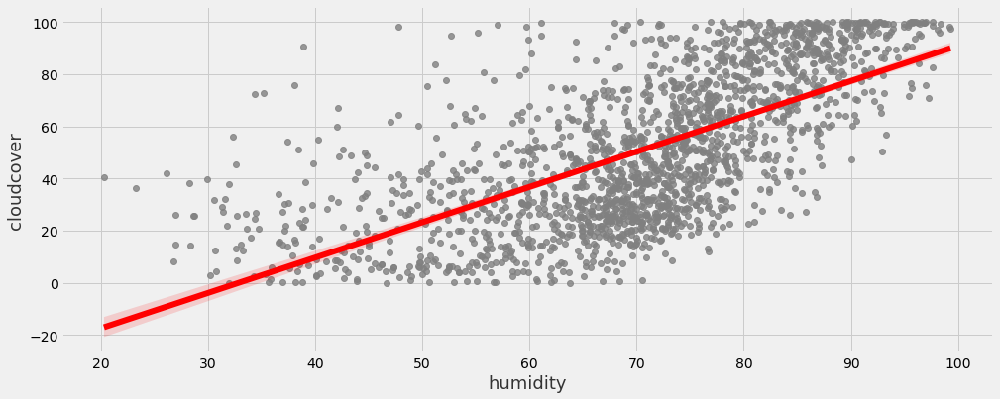

In [287]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="humidity", y='cloudcover',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("cloudcover",fontsize=18);
#plt.title("Offense Counts vs temperature",fontsize=18);
plt.xlabel("humidity",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

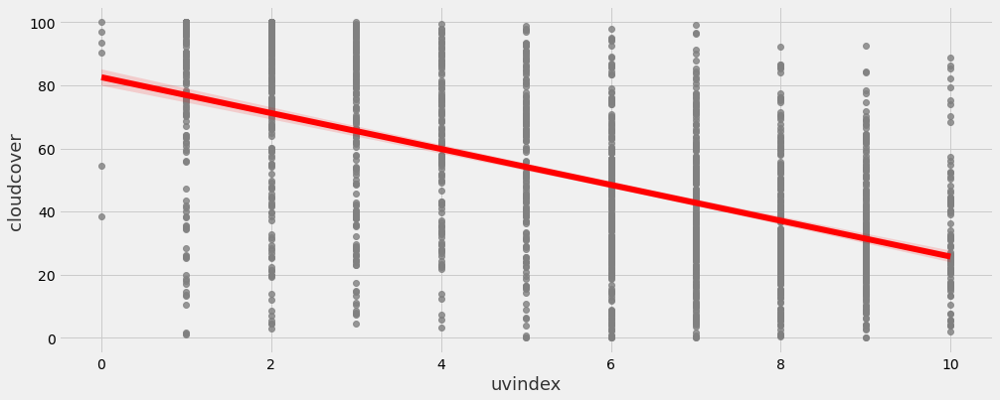

In [289]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="uvindex", y='cloudcover',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("cloudcover",fontsize=18);
#plt.title("Offense Counts vs temperature",fontsize=18);
plt.xlabel("uvindex",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

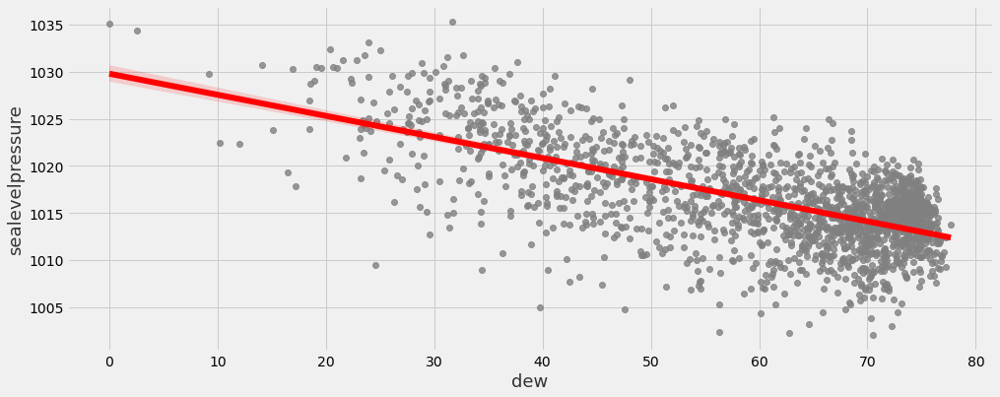

In [290]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="dew", y='sealevelpressure',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("sealevelpressure",fontsize=18);
#plt.title("Offense Counts vs temperature",fontsize=18);
plt.xlabel("dew",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

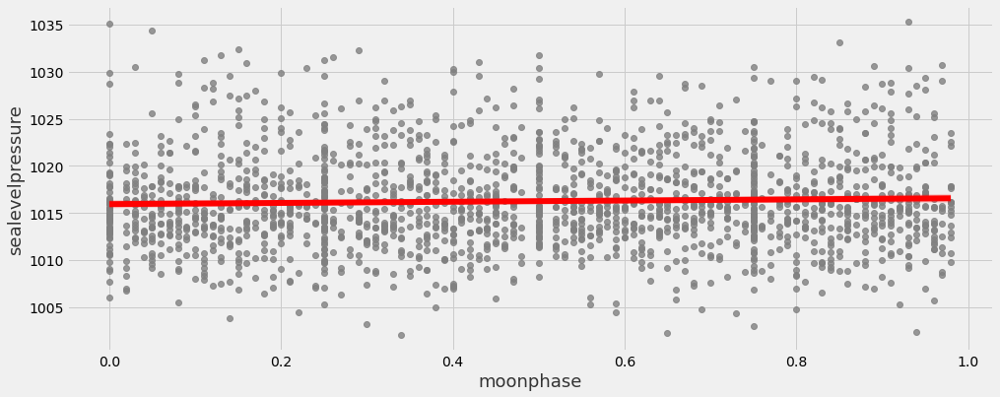

In [292]:
plt.close()
plt.figure(figsize=(15,6))
ax = sns.regplot(x="moonphase", y='sealevelpressure',data = cw_after,
                 scatter_kws={"color": "grey"}, line_kws={"color": "red"})

plt.ylabel("sealevelpressure",fontsize=18);
#plt.title("Offense Counts vs temperature",fontsize=18);
plt.xlabel("moonphase",fontsize=18)
plt.show()          
#plt.show()
#plt.xticks(fontsize=16);
#plt.xticks(rotation = 90);

In [350]:
f_after.shape

(1256390, 38)

# Regression Analysis for after 2018-06-01

In [373]:
data=f_after[['Date','Crime Against','Offense Category','conditions','season','Crime Against','Offense Count','tempmax','tempmin','temp', 'dew','humidity','feelslikemax','feelslikemin','feelslike','precip',
                   'precipcover', 'snowdepth','windgust','winddir', 'visibility','solarradiation','solarenergy']]
data.head()

,Date,Crime Against,Offense Category,conditions,season,Crime Against,Offense Count,tempmax,tempmin,temp,...,feelslikemin,feelslike,precip,precipcover,snowdepth,windgust,winddir,visibility,solarradiation,solarenergy
1050760,2018-06-01,Person,Assault Offenses,Partially cloudy,Summer,Person,1.0,94.0,75.8,84.6,...,75.8,90.1,0.0,0.0,0.0,21.9,171.5,9.2,78.8,6.9
1050761,2018-06-01,Person/Property/Society,All Other Offenses,Partially cloudy,Summer,Person/Property/Society,1.0,94.0,75.8,84.6,...,75.8,90.1,0.0,0.0,0.0,21.9,171.5,9.2,78.8,6.9
1050762,2018-06-01,Person,Assault Offenses,Partially cloudy,Summer,Person,1.0,94.0,75.8,84.6,...,75.8,90.1,0.0,0.0,0.0,21.9,171.5,9.2,78.8,6.9
1050763,2018-06-01,Property,Destruction/Damage/Vandalism of Property,Partially cloudy,Summer,Property,1.0,94.0,75.8,84.6,...,75.8,90.1,0.0,0.0,0.0,21.9,171.5,9.2,78.8,6.9
1050764,2018-06-01,Property,Larceny/Theft Offenses,Partially cloudy,Summer,Property,1.0,94.0,75.8,84.6,...,75.8,90.1,0.0,0.0,0.0,21.9,171.5,9.2,78.8,6.9


In [374]:
# Encode categorical variables
categorical_cols = ['Offense Category','conditions']
data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)
data.shape

(1256390, 61)

In [375]:
data.head()

,Date,Crime Against,season,Crime Against,Offense Count,tempmax,tempmin,temp,dew,humidity,...,Offense Category_Sex Offenses (Non-Forcible),Offense Category_Trespassing,Offense Category_Weapon Law Violations,conditions_Overcast,conditions_Partially cloudy,conditions_Rain,"conditions_Rain, Overcast","conditions_Rain, Partially cloudy","conditions_Snow, Partially cloudy","conditions_Snow, Rain, Overcast"
1050760,2018-06-01,Person,Summer,Person,1.0,94.0,75.8,84.6,75.3,76.1,...,0,0,0,0,1,0,0,0,0,0
1050761,2018-06-01,Person/Property/Society,Summer,Person/Property/Society,1.0,94.0,75.8,84.6,75.3,76.1,...,0,0,0,0,1,0,0,0,0,0
1050762,2018-06-01,Person,Summer,Person,1.0,94.0,75.8,84.6,75.3,76.1,...,0,0,0,0,1,0,0,0,0,0
1050763,2018-06-01,Property,Summer,Property,1.0,94.0,75.8,84.6,75.3,76.1,...,0,0,0,0,1,0,0,0,0,0
1050764,2018-06-01,Property,Summer,Property,1.0,94.0,75.8,84.6,75.3,76.1,...,0,0,0,0,1,0,0,0,0,0


In [376]:
# Drop unnecessary columns
data.drop([ 'Date'], axis=1, inplace=True)

In [377]:
data.columns

Index(['Crime Against', 'season', 'Crime Against', 'Offense Count', 'tempmax',
       'tempmin', 'temp', 'dew', 'humidity', 'feelslikemax', 'feelslikemin',
       'feelslike', 'precip', 'precipcover', 'snowdepth', 'windgust',
       'winddir', 'visibility', 'solarradiation', 'solarenergy',
       'Offense Category_All Other Offenses', 'Offense Category_Arson',
       'Offense Category_Assault Offenses', 'Offense Category_Bad Checks',
       'Offense Category_Bribery', 'Offense Category_Burglary/B&E',
       'Offense Category_Counterfeiting/Forgery',
       'Offense Category_Curfew/Loitering/Vagrancy Violations',
       'Offense Category_D Stolen Property Offenses',
       'Offense Category_Destruction/Damage/Vandalism of Property',
       'Offense Category_Disorderly Conduct',
       'Offense Category_Driving Under the Influence',
       'Offense Category_Drug/Narcotic Offenses',
       'Offense Category_Drunkenness', 'Offense Category_Embezzlement',
       'Offense Category_Extortion/

In [378]:
data.shape

(1256390, 60)

In [379]:
# Split the dataset into training and testing sets

from sklearn.model_selection import train_test_split

# Split the dataset in 70:30
np.random.seed(0)
df_train, df_test = train_test_split(data, train_size = 0.7 , test_size = 0.3 , random_state = 100)
print(df_train.shape)
print(df_test.shape)

(879473, 60)
(376917, 60)


In [380]:
# Normalization : (x-xmin)/(xmax - xmin)

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
num_vars1 = ['tempmax', 'tempmin', 'temp', 'dew',
       'humidity', 'feelslikemax', 'feelslikemin', 'feelslike', 'precip',
       'precipcover', 'snowdepth', 'windgust', 'winddir', 'visibility',
       'solarradiation', 'solarenergy']
df_train[num_vars1] = scaler.fit_transform(df_train[num_vars1])

In [381]:
df_train.columns

Index(['Crime Against', 'season', 'Crime Against', 'Offense Count', 'tempmax',
       'tempmin', 'temp', 'dew', 'humidity', 'feelslikemax', 'feelslikemin',
       'feelslike', 'precip', 'precipcover', 'snowdepth', 'windgust',
       'winddir', 'visibility', 'solarradiation', 'solarenergy',
       'Offense Category_All Other Offenses', 'Offense Category_Arson',
       'Offense Category_Assault Offenses', 'Offense Category_Bad Checks',
       'Offense Category_Bribery', 'Offense Category_Burglary/B&E',
       'Offense Category_Counterfeiting/Forgery',
       'Offense Category_Curfew/Loitering/Vagrancy Violations',
       'Offense Category_D Stolen Property Offenses',
       'Offense Category_Destruction/Damage/Vandalism of Property',
       'Offense Category_Disorderly Conduct',
       'Offense Category_Driving Under the Influence',
       'Offense Category_Drug/Narcotic Offenses',
       'Offense Category_Drunkenness', 'Offense Category_Embezzlement',
       'Offense Category_Extortion/

In [382]:
df_train.describe()

,Offense Count,tempmax,tempmin,temp,dew,humidity,feelslikemax,feelslikemin,feelslike,precip,...,Offense Category_Sex Offenses (Non-Forcible),Offense Category_Trespassing,Offense Category_Weapon Law Violations,conditions_Overcast,conditions_Partially cloudy,conditions_Rain,"conditions_Rain, Overcast","conditions_Rain, Partially cloudy","conditions_Snow, Partially cloudy","conditions_Snow, Rain, Overcast"
count,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,...,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.000000,879473.00000,879473.000000,879473.000000
mean,1.034930,0.711876,0.755225,0.757281,0.782609,0.635048,0.725295,0.714385,0.741120,0.014874,...,0.000307,0.022302,0.012760,0.048356,0.428714,0.008133,0.077211,0.29941,0.000580,0.001733
std,0.246016,0.164969,0.183814,0.173286,0.185789,0.175055,0.159404,0.158703,0.159940,0.047187,...,0.017519,0.147664,0.112237,0.214518,0.494892,0.089817,0.266926,0.45800,0.024074,0.041592
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1.000000,0.604651,0.621969,0.643159,0.671815,0.550633,0.613428,0.622680,0.639831,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,1.000000,0.736434,0.803138,0.792666,0.853282,0.654430,0.729400,0.753608,0.754237,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,1.000000,0.852713,0.915835,0.906911,0.933076,0.751899,0.870804,0.835052,0.876059,0.004191,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.00000,0.000000,0.000000
max,65.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


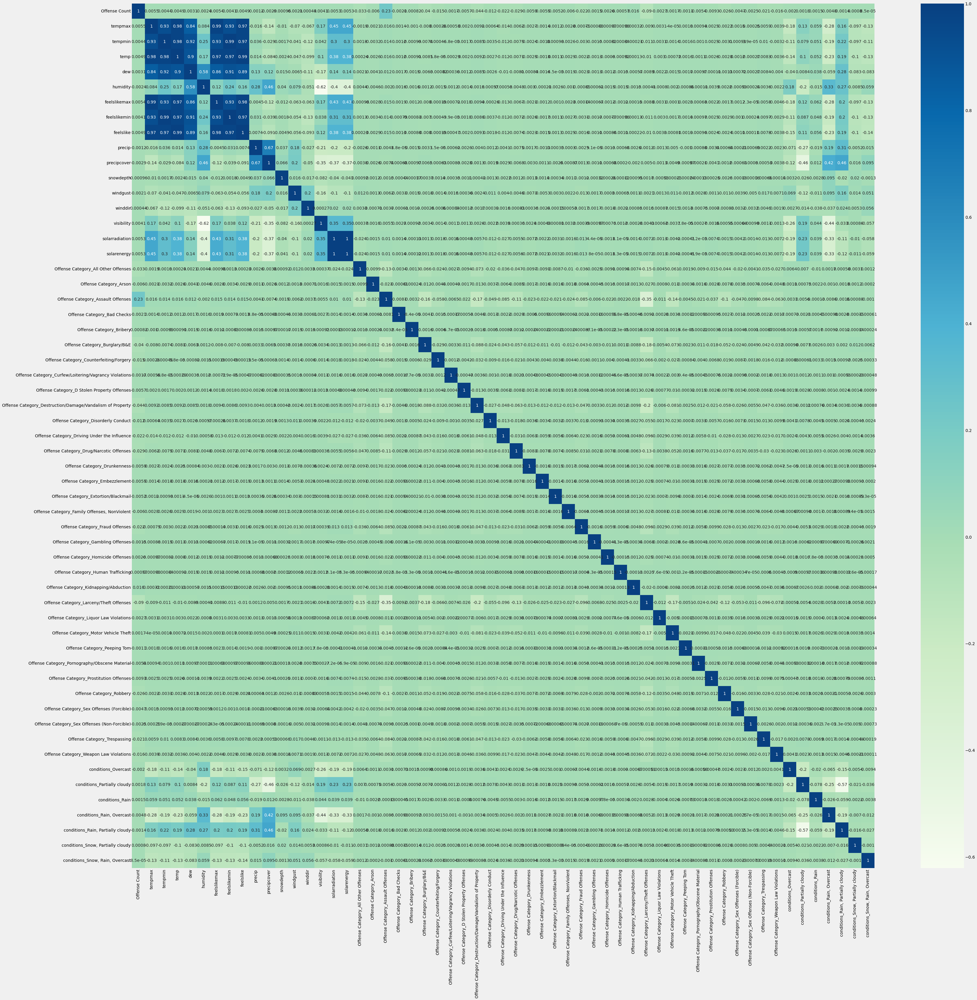

In [383]:
plt.figure(figsize = (50,50))
sns.heatmap(df_train.corr(), annot = True , cmap="GnBu")
plt.show()

## Regression model building

In [384]:
#Dividing into X and y set for model building

y_train = df_train.pop('Offense Count')
X_train = df_train

In [385]:
# Building the Model

import statsmodels.api as sm

#Add a constant
X_train_lm = X_train[['tempmax', 'tempmin', 'temp', 'dew', 'humidity', 'feelslikemax',
       'feelslikemin', 'feelslike', 'precip', 'precipcover', 'snowdepth',
       'windgust', 'winddir', 'visibility', 'solarradiation', 'solarenergy']]
X_train_lm = sm.add_constant(X_train_lm)
lr  = sm.OLS(y_train, X_train_lm).fit()
lr.params

const             1.036886
tempmax           0.003731
tempmin           0.012195
temp             -0.019680
dew               0.030146
humidity         -0.015873
feelslikemax      0.007271
feelslikemin     -0.013468
feelslike        -0.012726
precip            0.002369
precipcover      -0.000400
snowdepth        -0.006613
windgust         -0.002694
winddir           0.000961
visibility        0.001180
solarradiation   -0.020953
solarenergy       0.026542
dtype: float64

In [386]:
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:          Offense Count   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.924
Date:                Fri, 22 Sep 2023   Prob (F-statistic):           7.36e-05
Time:                        21:45:42   Log-Likelihood:                -14557.
No. Observations:              879473   AIC:                         2.915e+04
Df Residuals:                  879456   BIC:                         2.935e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              1.0369      0.007    151.

In [388]:
X_train.columns

Index(['Crime Against', 'season', 'Crime Against', 'tempmax', 'tempmin',
       'temp', 'dew', 'humidity', 'feelslikemax', 'feelslikemin', 'feelslike',
       'precip', 'precipcover', 'snowdepth', 'windgust', 'winddir',
       'visibility', 'solarradiation', 'solarenergy',
       'Offense Category_All Other Offenses', 'Offense Category_Arson',
       'Offense Category_Assault Offenses', 'Offense Category_Bad Checks',
       'Offense Category_Bribery', 'Offense Category_Burglary/B&E',
       'Offense Category_Counterfeiting/Forgery',
       'Offense Category_Curfew/Loitering/Vagrancy Violations',
       'Offense Category_D Stolen Property Offenses',
       'Offense Category_Destruction/Damage/Vandalism of Property',
       'Offense Category_Disorderly Conduct',
       'Offense Category_Driving Under the Influence',
       'Offense Category_Drug/Narcotic Offenses',
       'Offense Category_Drunkenness', 'Offense Category_Embezzlement',
       'Offense Category_Extortion/Blackmail',
     

In [389]:
X_train_lm = X_train[['conditions_Overcast',
       'conditions_Partially cloudy', 'conditions_Rain',
       'conditions_Rain, Overcast', 'conditions_Rain, Partially cloudy',
       'conditions_Snow, Partially cloudy', 'conditions_Snow, Rain, Overcast']]
X_train_lm = sm.add_constant(X_train_lm)
lr  = sm.OLS(y_train, X_train_lm).fit()
lr.params

const                                1.037276
conditions_Overcast                 -0.004497
conditions_Partially cloudy         -0.001839
conditions_Rain                      0.001729
conditions_Rain, Overcast           -0.006453
conditions_Rain, Partially cloudy   -0.002858
conditions_Snow, Partially cloudy    0.005862
conditions_Snow, Rain, Overcast     -0.001843
dtype: float64

In [390]:
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:          Offense Count   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     5.474
Date:                Fri, 22 Sep 2023   Prob (F-statistic):           2.63e-06
Time:                        21:50:44   Log-Likelihood:                -14561.
No. Observations:              879473   AIC:                         2.914e+04
Df Residuals:                  879465   BIC:                         2.923e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

In [397]:
f_after.head()

,Date,Offense Count,NIBRS Description,Offense Code,Crime Against,Offense Category,tempmax,tempmin,temp,feelslikemax,...,conditions,Daylight(hr),year,month,day,mon-year,month_num,day_num,season,occurence_hour
1050760,2018-06-01,1.0,Simple assault,13B,Person,Assault Offenses,94.0,75.8,84.6,104.2,...,Partially cloudy,13.934167,2018,Jun,Fri,Jun 2018,6,5,Summer,20
1050761,2018-06-01,1.0,All other offenses,90Z,Person/Property/Society,All Other Offenses,94.0,75.8,84.6,104.2,...,Partially cloudy,13.934167,2018,Jun,Fri,Jun 2018,6,5,Summer,17
1050762,2018-06-01,1.0,Simple assault,13B,Person,Assault Offenses,94.0,75.8,84.6,104.2,...,Partially cloudy,13.934167,2018,Jun,Fri,Jun 2018,6,5,Summer,17
1050763,2018-06-01,1.0,"Destruction, damage, vandalism",290,Property,Destruction/Damage/Vandalism of Property,94.0,75.8,84.6,104.2,...,Partially cloudy,13.934167,2018,Jun,Fri,Jun 2018,6,5,Summer,17
1050764,2018-06-01,1.0,Shoplifting,23C,Property,Larceny/Theft Offenses,94.0,75.8,84.6,104.2,...,Partially cloudy,13.934167,2018,Jun,Fri,Jun 2018,6,5,Summer,17


# Time Series Analysis

In [412]:
# offense count
cgdf=f_after.groupby('Date')["Offense Count"].agg(counts = sum).sort_values('counts',ascending=False)
cgdf=cgdf.sort_values("Date")
cgdf.head()

,counts
Date,
2018-06-01,836.0
2018-06-02,720.0
2018-06-03,716.0
2018-06-04,726.0
2018-06-05,750.0


In [415]:
tsc=cgdf.reset_index()
tsc.head()

,Date,counts
0,2018-06-01,836.0
1,2018-06-02,720.0
2,2018-06-03,716.0
3,2018-06-04,726.0
4,2018-06-05,750.0


<Figure size 864x1080 with 0 Axes>

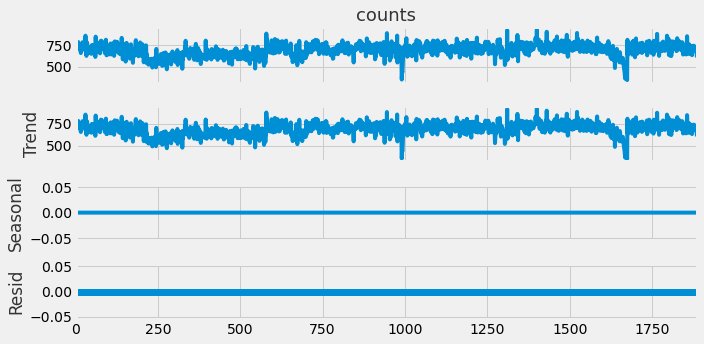

In [416]:
# Decompose the time series as an additive model into observed, trend, seasonal, and resid
from statsmodels.tsa.seasonal import seasonal_decompose
plt.close()
#fig, ax = plt.subplots(figsize=(30,20))
fig = plt.figure(figsize=(12, 15))

dc = seasonal_decompose(tsc['counts'], model = "add",extrapolate_trend='freq', period=1)
dc.plot()
plt.ioff();

In [ ]:
#function to test statinarity with rolloing windows

In [511]:
def test_stationarity(data,var):
    data["rollmean"]=data[var].rolling(window=180).mean() # 180days window
    data["rollstd"]=data[var].rolling(window=180).std()
    
    from statsmodels.tsa.stattools import adfuller
    adfTest=adfuller(data[var],autolag='AIC',)
    
    stats=pd.Series(adfTest[0:4],index=["Test Statistic","p-value",'#lags used','number of observations used'])
    print(stats)
    
    for key, values in adfTest[4].items():
        print('criticality',key,":",values)
        
    plt.figure(figsize=(10,5))
    sns.lineplot(data=data,x=data.index,y=var,lw=1);
    sns.lineplot(data=data,x=data.index,y="rollmean",lw=2);
    sns.lineplot(data=data,x=data.index,y="rollstd",lw=2);

Test Statistic                   -4.270714
p-value                           0.000499
#lags used                       20.000000
number of observations used    1866.000000
dtype: float64
criticality 1% : -3.4338592810961988
criticality 5% : -2.863090150334371
criticality 10% : -2.5675952440295053


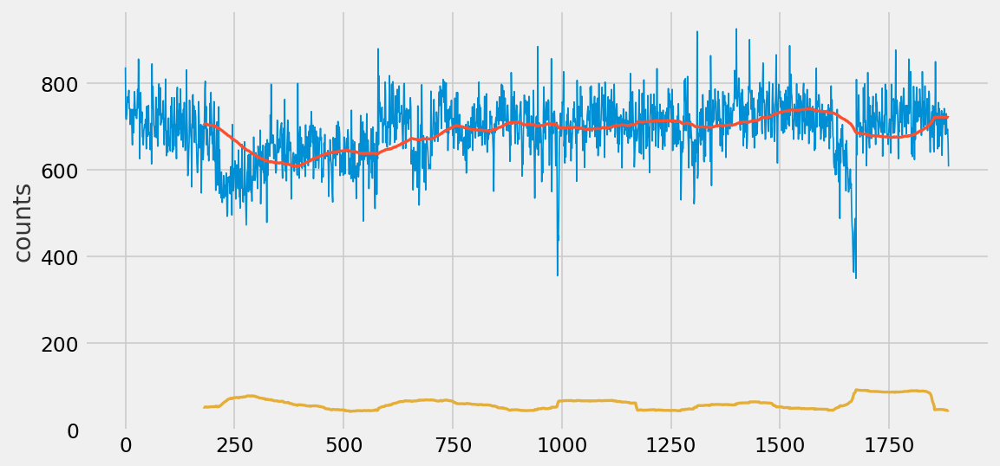

In [512]:
test_stationarity(tsc,'counts')

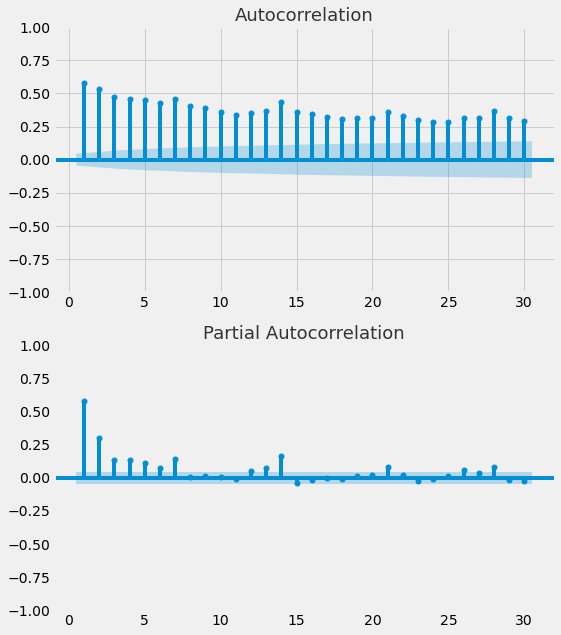

In [424]:
## offense
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, plot_predict
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 10))
plt.grid()
plot_acf(tsc['counts'], zero=False, lags=30, ax=ax1)
plot_pacf(tsc['counts'], zero=False, lags=30, ax=ax2);

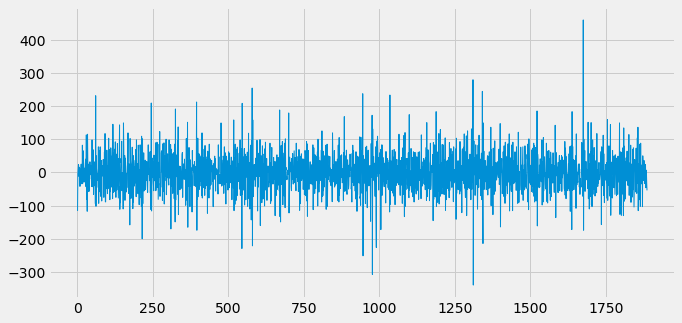

In [436]:
fig = plt.figure(figsize=(10, 5))
cdiff1 = tsc['counts'].diff().dropna()
cdiff1.plot(lw=1);

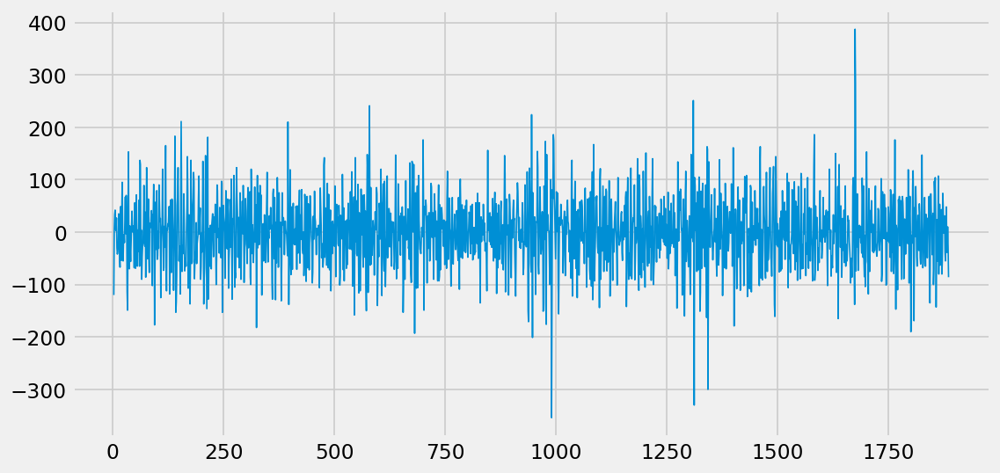

In [444]:
fig = plt.figure(figsize=(10, 5))
cdiff2 = tsc['counts'].diff(2).dropna()
cdiff2.plot(lw=1);

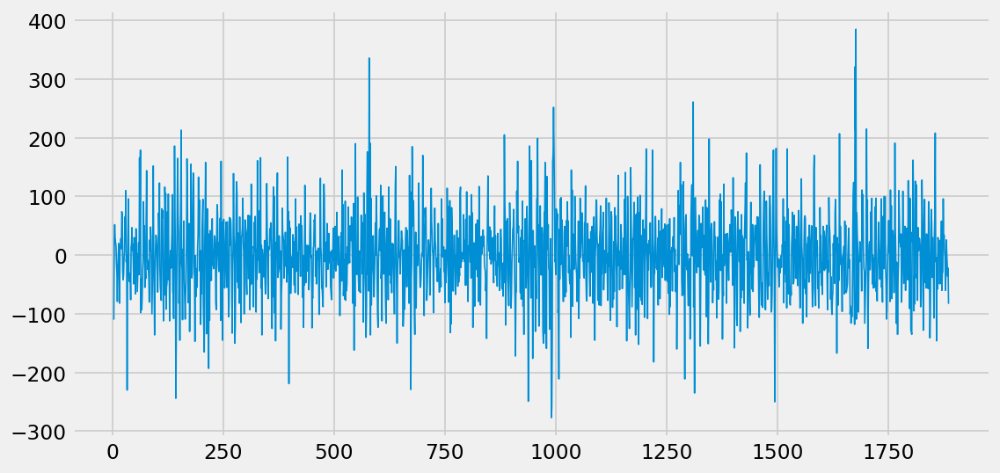

In [445]:
fig = plt.figure(figsize=(10, 5))
cdiff3 = tsc['counts'].diff(3).dropna()
cdiff3.plot(lw=1);

In [437]:
adf_test(cdiff1)

Results of Dickey-Fuller Test: 
Test Statistic                -1.331988e+01
p-value                        6.490618e-25
#Lags Used                     2.600000e+01
Number of Observations Used    1.859000e+03
Critical Value (1%)           -3.433873e+00
Critical Value (5%)           -2.863096e+00
Critical Value (10%)          -2.567598e+00
dtype: float64


In [446]:
adf_test(cdiff2)

Results of Dickey-Fuller Test: 
Test Statistic                -1.237442e+01
p-value                        5.193964e-23
#Lags Used                     2.600000e+01
Number of Observations Used    1.858000e+03
Critical Value (1%)           -3.433874e+00
Critical Value (5%)           -2.863097e+00
Critical Value (10%)          -2.567599e+00
dtype: float64


In [447]:
adf_test(cdiff3)

Results of Dickey-Fuller Test: 
Test Statistic                -1.237452e+01
p-value                        5.191573e-23
#Lags Used                     2.600000e+01
Number of Observations Used    1.857000e+03
Critical Value (1%)           -3.433876e+00
Critical Value (5%)           -2.863098e+00
Critical Value (10%)          -2.567599e+00
dtype: float64


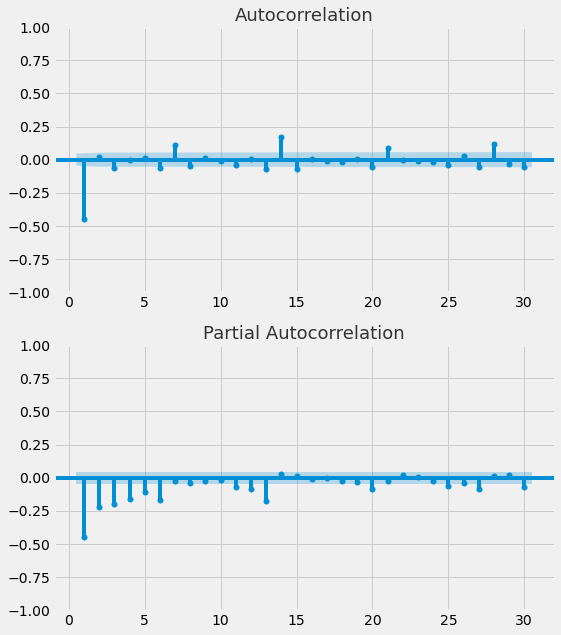

In [438]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 10))
plt.title("ACF & PACF with One Order Differencing")
plot_acf(cdiff1, zero=False, lags=30, ax=ax1)
plot_pacf(cdiff1, zero=False, lags=30, ax=ax2);

In [ ]:
# at diff 1, p (1,2,3,4,6) and q=1 looks significant

In [ ]:
since p value is greater than the t statistics, null hypothesis fails not stationaty 

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

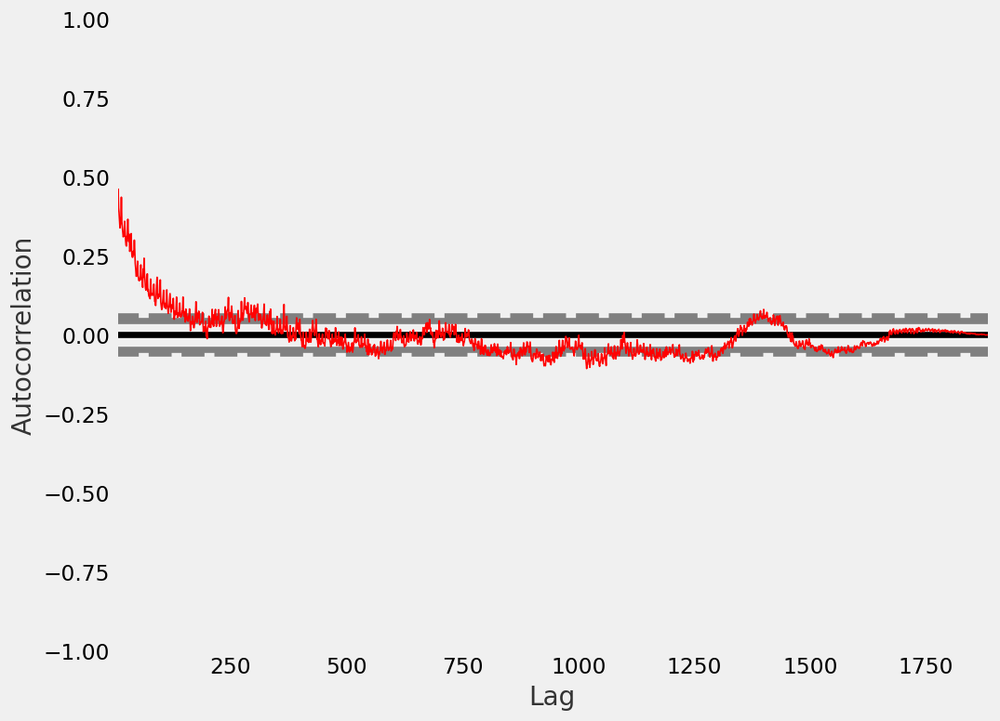

In [461]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(tsc["counts"],lw=1,color='red')

In [466]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(tsc["counts"], order = (1,1,1))
model_fit = model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 counts   No. Observations:                 1887
Model:                 ARIMA(1, 1, 1)   Log Likelihood              -10107.523
Date:                Fri, 22 Sep 2023   AIC                          20221.047
Time:                        23:20:07   BIC                          20237.674
Sample:                             0   HQIC                         20227.170
                               - 1887                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1848      0.025      7.458      0.000       0.136       0.233
ma.L1         -0.8619      0.012    -69.584      0.000      -0.886      -0.838
sigma2      2644.1437     53.686     49.252      0.000    2538.921    2749.367
===================================================================================
Ljung-Box (L1) (Q):                   0.36   Jarque-Bera (JB):               995.61
Prob(Q):                              0.55   Prob(JB):                         0.00
Heteroskedasticity (H):               1.19   Skew:                             0.39
Prob(H) (two-sided):                  0.03   Kurtosis:                         6.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## Model Visualization
The model prediction and the actual are very close
The future forecast looks constant

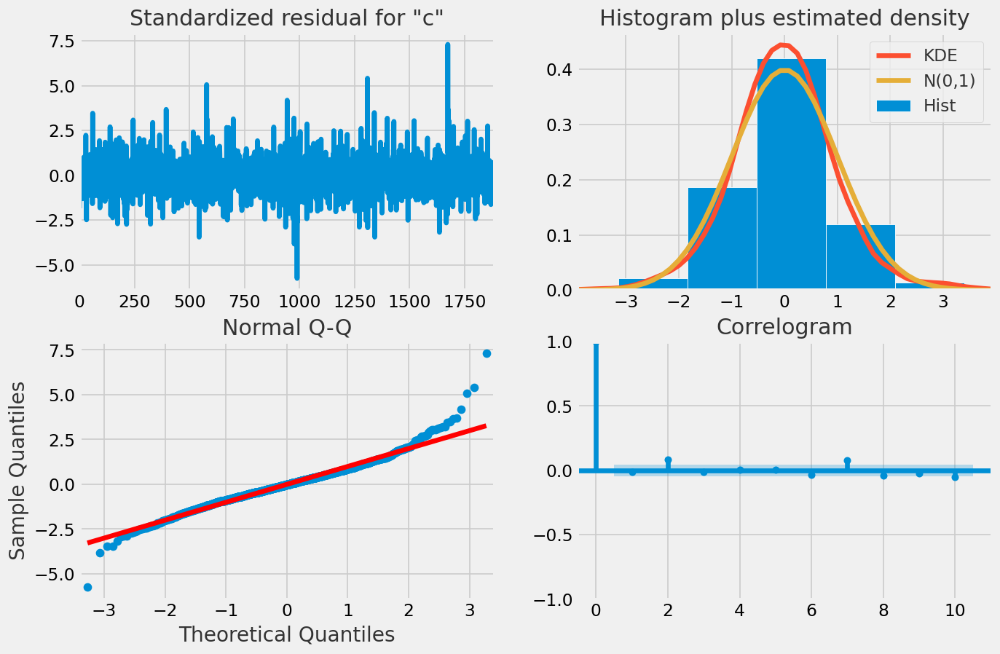

In [467]:
# Create the 4 diagnositcs plots
fig = plt.figure(figsize=(12,8))
model_fit.plot_diagnostics(fig=fig)
plt.show() # Use plt.show() here explicitly to avoid creating a duplicate plot

In [471]:
tsc.head()

,Date,counts
0,2018-06-01,836.0
1,2018-06-02,720.0
2,2018-06-03,716.0
3,2018-06-04,726.0
4,2018-06-05,750.0


In [472]:
ts=tsc[["counts"]]
ts.head()

,counts
0,836.0
1,720.0
2,716.0
3,726.0
4,750.0


In [473]:
from sklearn.metrics import mean_squared_error
from math import sqrt
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

X = ts.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
 model = ARIMA(history, order=(1,1,1))
 model_fit = model.fit()
 output = model_fit.forecast()
 yhat = output[0]
 predictions.append(yhat)
 obs = test[t]
 history.append(obs)
 #print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
r2= r2_score(test, predictions)
mse= mean_squared_error(test, predictions)
mape= mean_absolute_percentage_error(test, predictions)
        #rmse.append(np.sqrt(mean_squared_error(test, pred)))
print('Test RMSE: %.3f' % rmse)
print('Test R-square: %.3f' % r2)
print('Test MSE: %.3f' % mse)
print('Test Mean Absolute percentage Error: %.3f' % mape)

Test RMSE: 54.168
Test R-square: 0.364
Test MSE: 2934.155
Test Mean Absolute percentage Error: 0.058


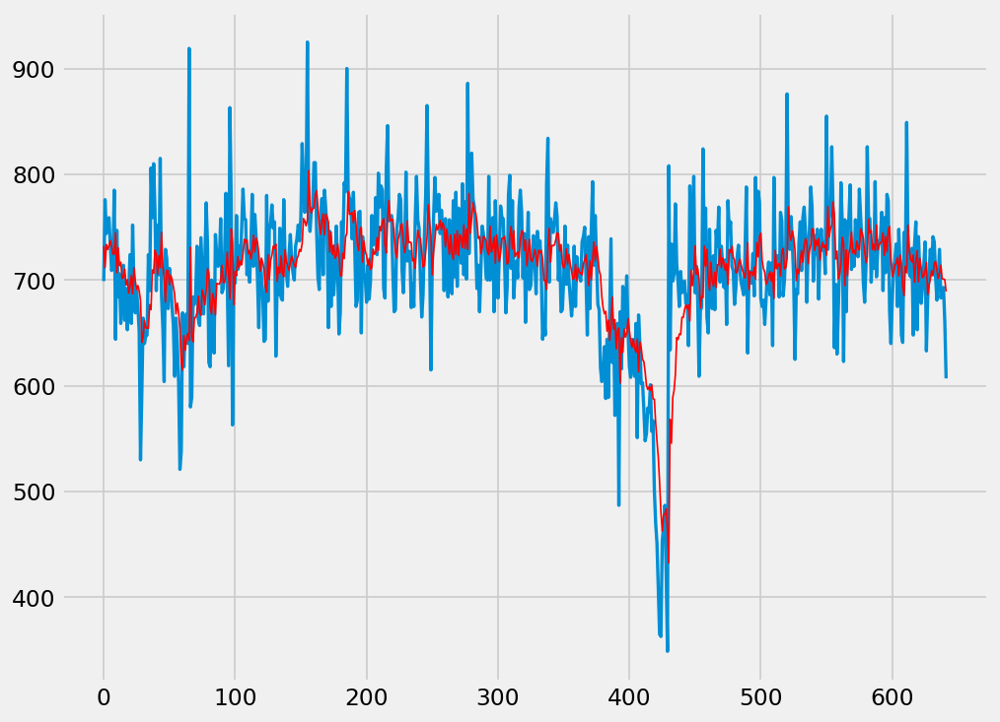

In [491]:
# plot forecasts against actual outcomes
plt.plot(test, lw=2)
plt.plot(predictions, color='red',lw=1)
plt.show()

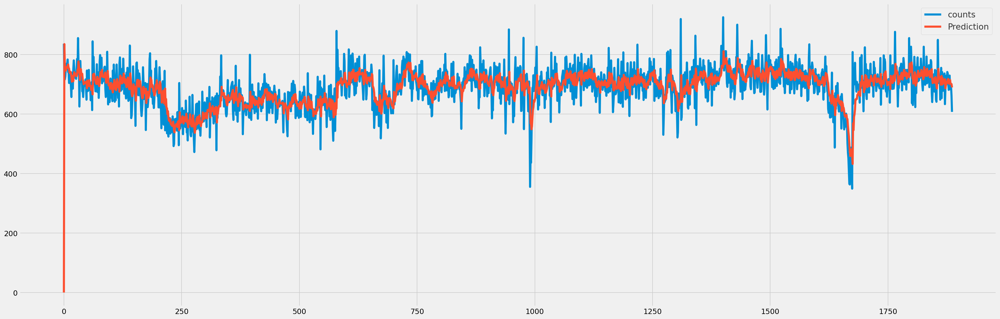

In [482]:
final_model=ARIMA(ts,order=(1,1,1)).fit()
prediction=final_model.predict()


ts.plot(legend=True, label='Actual',figsize=(30,10));
prediction.plot(legend=True,label='Prediction');
plot_predict(final_model, dynamic=False, ax=ax);
plt.legend(fontsize=16)

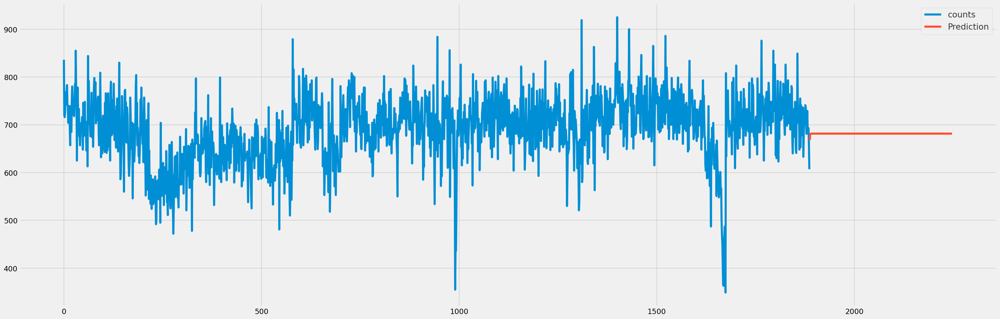

In [520]:
prediction2=arima_model.predict(len(ts),len(ts)+360)
arima_model=ARIMA(tsc.counts,order=(1,1,1)).fit()

ts.plot(legend=True, label='Actual',figsize=(30,10));
prediction2.plot(legend=True,label='Prediction');
plot_predict(final_model, dynamic=False, ax=ax);
plt.legend(fontsize=16)


## timeshift stratgey

In [501]:
#since the T statistics  for ARIMA model is lower than than p values 0.05, we will not apply below time shift strategy

In [503]:
stats=pd.Series(adfTest[0:4],index=["Test Statistic","p-value",'#lags used','number of observations used'])
stats

Test Statistic                   -4.270714
p-value                           0.000499
#lags used                       20.000000
number of observations used    1866.000000
dtype: float64

# Temp Forcast

In [417]:
## for temp forcast
tgdf=f_after.groupby('Date')["tempmax"].agg(tmeans = np.mean).sort_values('tmeans',ascending=False)
tgdf=tgdf.sort_values("Date")
tgdf.head()

,tmeans
Date,
2018-06-01,94.0
2018-06-02,94.2
2018-06-03,96.2
2018-06-04,92.0
2018-06-05,94.9


In [418]:
tst=tgdf.reset_index()
tst.head()

,Date,tmeans
0,2018-06-01,94.0
1,2018-06-02,94.2
2,2018-06-03,96.2
3,2018-06-04,92.0
4,2018-06-05,94.9


<Figure size 864x1080 with 0 Axes>

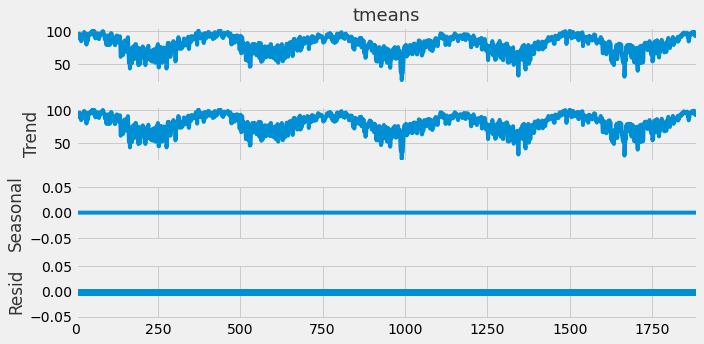

In [419]:
# Decompose the time series as an additive model into observed, trend, seasonal, and resid
from statsmodels.tsa.seasonal import seasonal_decompose
plt.close()
#fig, ax = plt.subplots(figsize=(30,20))
fig = plt.figure(figsize=(12, 15))

dc = seasonal_decompose(tst['tmeans'], model = "add",extrapolate_trend='freq', period=1)
dc.plot()
plt.ioff();

In [423]:
adf_test(tst['tmeans']) # for tempmax

Results of Dickey-Fuller Test: 
Test Statistic                   -3.387686
p-value                           0.011386
#Lags Used                       13.000000
Number of Observations Used    1873.000000
Critical Value (1%)              -3.433846
Critical Value (5%)              -2.863084
Critical Value (10%)             -2.567592
dtype: float64


### Since the p-value is not less than .05, we fail to reject the null hypothesis.
the data is not stationary

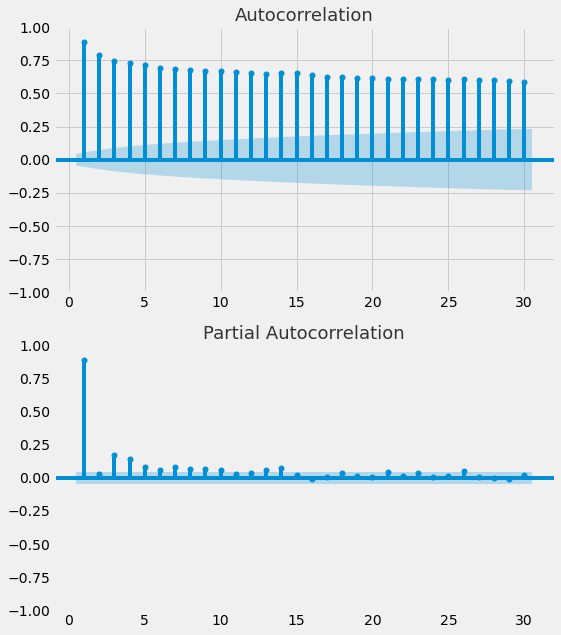

In [425]:
## tempmax
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, plot_predict
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 10))
plt.grid()
plot_acf(tst['tmeans'], zero=False, lags=30, ax=ax1)
plot_pacf(tst['tmeans'], zero=False, lags=30, ax=ax2);

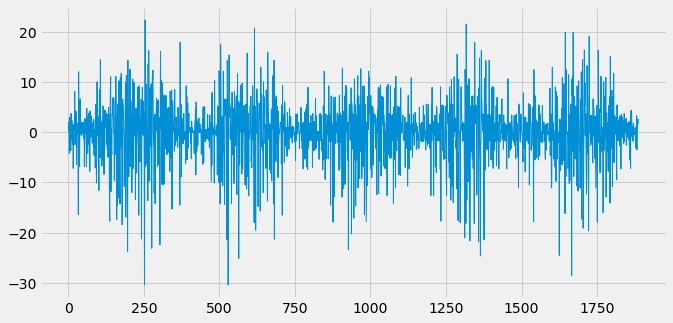

In [433]:
fig = plt.figure(figsize=(10, 5))
tdiff1 = tst['tmeans'].diff().dropna()
tdiff1.plot(lw=1);

In [434]:
adf_test(tdiff1)

Results of Dickey-Fuller Test: 
Test Statistic                -1.846869e+01
p-value                        2.141468e-30
#Lags Used                     1.200000e+01
Number of Observations Used    1.873000e+03
Critical Value (1%)           -3.433846e+00
Critical Value (5%)           -2.863084e+00
Critical Value (10%)          -2.567592e+00
dtype: float64


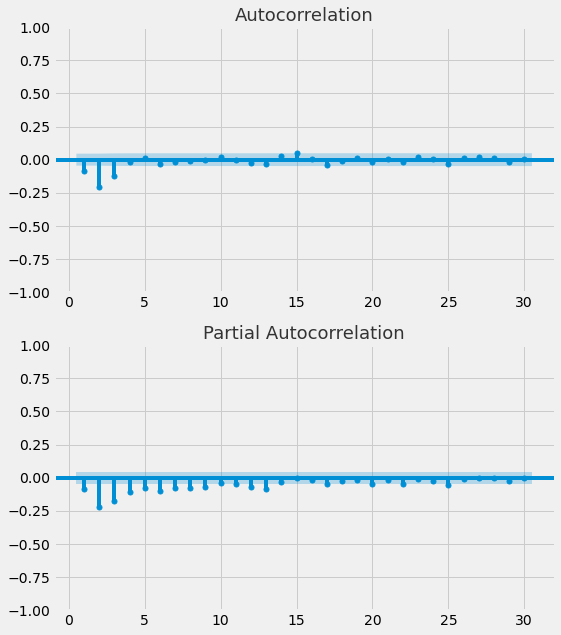

In [435]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 10))
plt.title("ACF & PACF with One Order Differencing")
plot_acf(tdiff1, zero=False, lags=30, ax=ax1)
plot_pacf(tdiff1, zero=False, lags=30, ax=ax2);

In [ ]:
# at diff 1, p (1) and q=(1,-5) looks significant

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

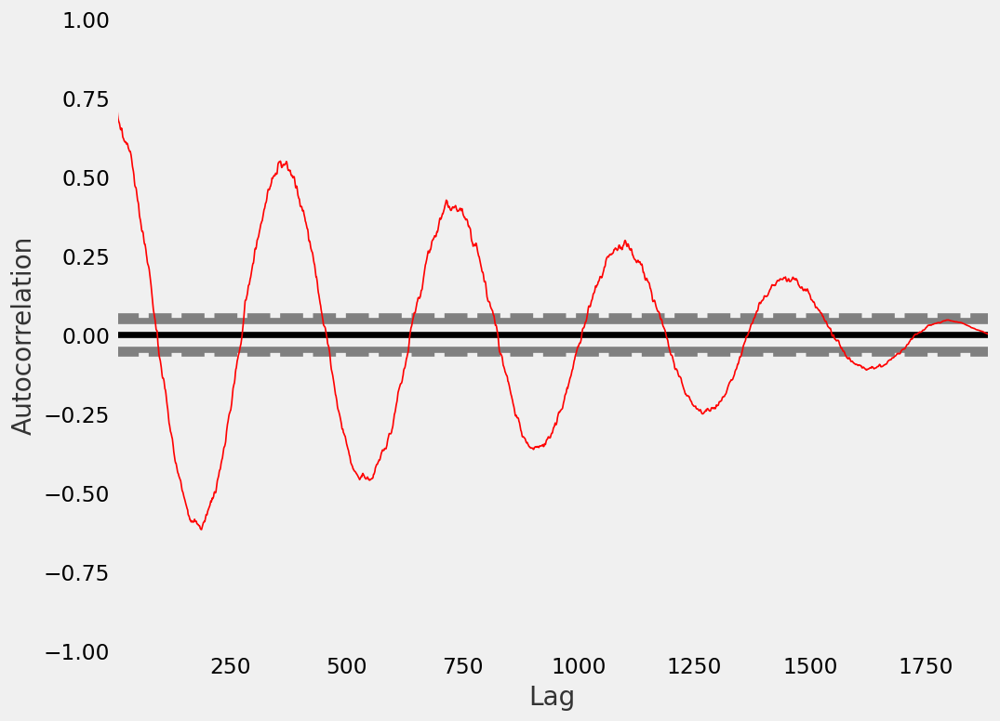

In [462]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(tst["tmeans"],lw=1,color='red')

In [526]:
def test_stationarity(data,var):
    data["rollmean"]=data[var].rolling(window=30).mean() # 180days window
    data["rollstd"]=data[var].rolling(window=30).std()
    
    from statsmodels.tsa.stattools import adfuller
    adfTest=adfuller(data[var],autolag='AIC',)
    
    stats=pd.Series(adfTest[0:4],index=["Test Statistic","p-value",'#lags used','number of observations used'])
    print(stats)
    
    for key, values in adfTest[4].items():
        print('criticality',key,":",values)
        
    plt.figure(figsize=(10,5))
    sns.lineplot(data=data,x=data.index,y=var,lw=1);
    sns.lineplot(data=data,x=data.index,y="rollmean",lw=2);
    sns.lineplot(data=data,x=data.index,y="rollstd",lw=2);

Test Statistic                   -3.387686
p-value                           0.011386
#lags used                       13.000000
number of observations used    1873.000000
dtype: float64
criticality 1% : -3.433846147749841
criticality 5% : -2.8630843523534826
criticality 10% : -2.567592156824906


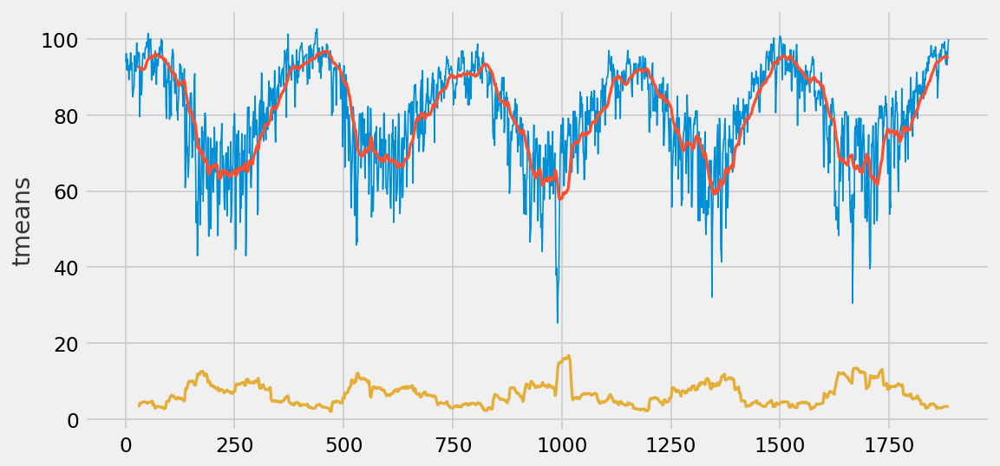

In [527]:
test_stationarity(tst,'tmeans')

In [528]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(tst["tmeans"], order = (2,1,2))
model_fit = model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                 tmeans   No. Observations:                 1887
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -5963.778
Date:                Sat, 23 Sep 2023   AIC                          11937.557
Time:                        00:35:29   BIC                          11965.268
Sample:                             0   HQIC                         11947.762
                               - 1887                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5478      0.152      3.597      0.000       0.249       0.846
ar.L2         -0.0516      0.099     -0.519      0.603      -0.246       0.143
ma.L1         -0.7623      0.153     -4.982      0.000      -1.062      -0.462
ma.L2         -0.1237      0.142     -0.869      0.385      -0.403       0.155
sigma2        32.6552      0.703     46.441      0.000      31.277      34.033
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               897.30
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.97   Skew:                            -0.98
Prob(H) (two-sided):                  0.69   Kurtosis:                         5.75
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## time shift strategy

In [529]:
# since p value is greater than 0.05 we can test below strategy for forcasting
statC_df=tst[["tmeans"]]
statC_df['shift']=statC_df['tmeans'].shift()
statC_df['shiftDiff']=statC_df['tmeans'] -statC_df['shift']
statC_df['sqrt']=np.sqrt(statC_df["tmeans"])
statC_df['cbrt']=np.cbrt(statC_df["tmeans"])
statC_df['log']=np.log(statC_df["tmeans"])
statC_df['logshift']=statC_df['log'] - statC_df['log'].shift()
statC_df['logsqrt']=np.sqrt(statC_df["log"])
statC_df['logsqrtshift']=statC_df['logsqrt'] - statC_df['logsqrt'].shift()
statC_df['sqrt']=np.sqrt(statC_df["tmeans"])
statC_df['log']=np.log(statC_df["tmeans"])
statC_df.head()

,tmeans,shift,shiftDiff,sqrt,cbrt,log,logshift,logsqrt,logsqrtshift
0,94.0,NaN,NaN,9.695360,4.546836,4.543295,NaN,2.131501,NaN
1,94.2,94.0,0.2,9.705668,4.550058,4.545420,0.002125,2.131999,0.000499
2,96.2,94.2,2.0,9.808160,4.582035,4.566429,0.021009,2.136921,0.004921
3,92.0,96.2,-4.2,9.591663,4.514357,4.521789,-0.044641,2.126450,-0.010471
4,94.9,92.0,2.9,9.741663,4.561301,4.552824,0.031035,2.133735,0.007285


Test Statistic                   -3.616390
p-value                           0.005455
#lags used                       13.000000
number of observations used    1873.000000
dtype: float64
criticality 1% : -3.433846147749841
criticality 5% : -2.8630843523534826
criticality 10% : -2.567592156824906


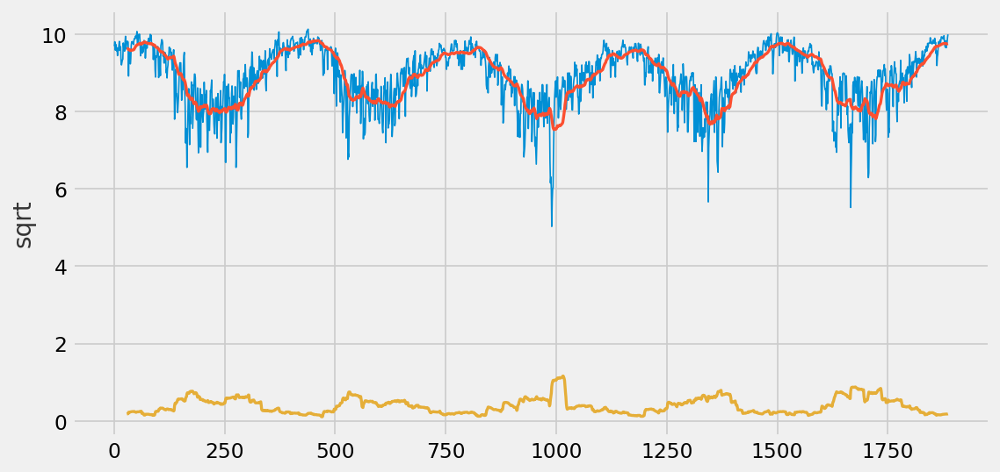

In [531]:
test_stationarity(statC_df,'sqrt')

Test Statistic                   -3.902536
p-value                           0.002016
#lags used                       13.000000
number of observations used    1873.000000
dtype: float64
criticality 1% : -3.433846147749841
criticality 5% : -2.8630843523534826
criticality 10% : -2.567592156824906


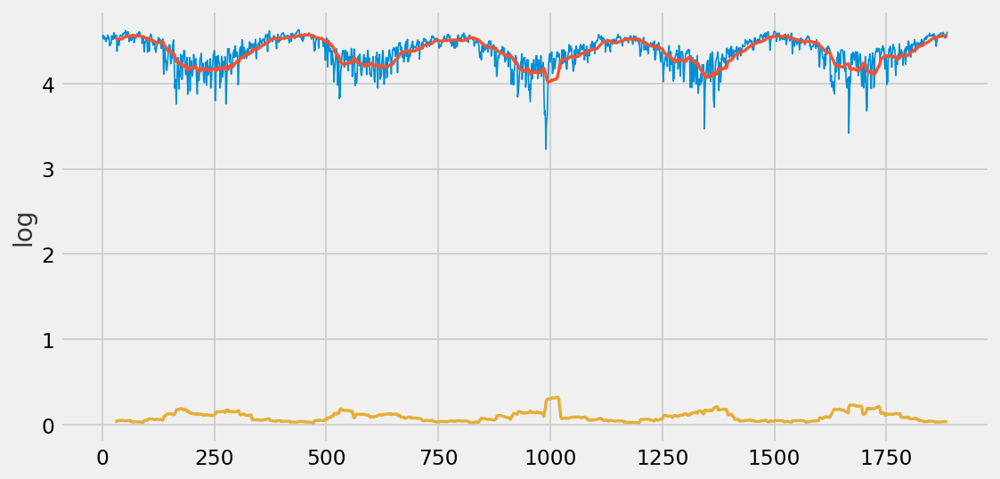

In [532]:
test_stationarity(statC_df,'log')

Test Statistic                   -3.981609
p-value                           0.001510
#lags used                       13.000000
number of observations used    1873.000000
dtype: float64
criticality 1% : -3.433846147749841
criticality 5% : -2.8630843523534826
criticality 10% : -2.567592156824906


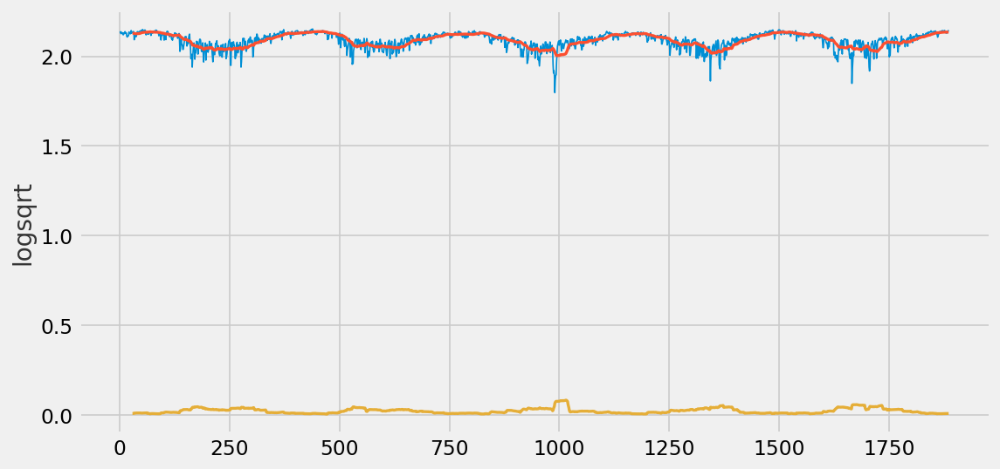

In [533]:
test_stationarity(statC_df,'logsqrt')

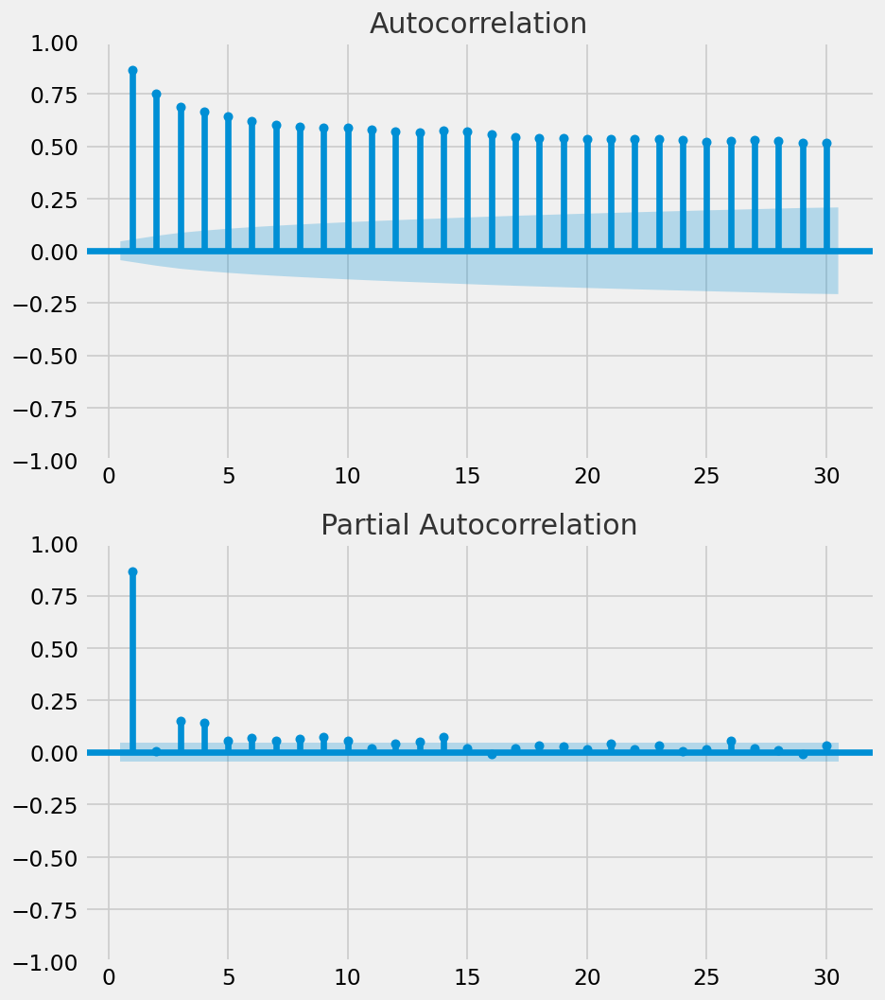

In [554]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 10))
plt.title("ACF & PACF with One Order Differencing")
plot_acf(statC_df.logsqrt, zero=False, lags=30, ax=ax1)
plot_pacf(statC_df.logsqrt, zero=False, lags=30, ax=ax2);

In [555]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(statC_df.logsqrt, order = (1,0,1))
logsqrtmodel_fit = model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   sqrt   No. Observations:                 1887
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -694.276
Date:                Sat, 23 Sep 2023   AIC                           1394.552
Time:                        01:00:48   BIC                           1411.179
Sample:                             0   HQIC                          1400.675
                               - 1887                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6399      0.021     30.640      0.000       0.599       0.681
ma.L1         -0.9256      0.011    -83.033      0.000      -0.947      -0.904
sigma2         0.1222      0.002     53.230      0.000       0.118       0.127
===================================================================================
Ljung-Box (L1) (Q):                  11.12   Jarque-Bera (JB):              1922.03
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.01   Skew:                            -1.26
Prob(H) (two-sided):                  0.94   Kurtosis:                         7.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

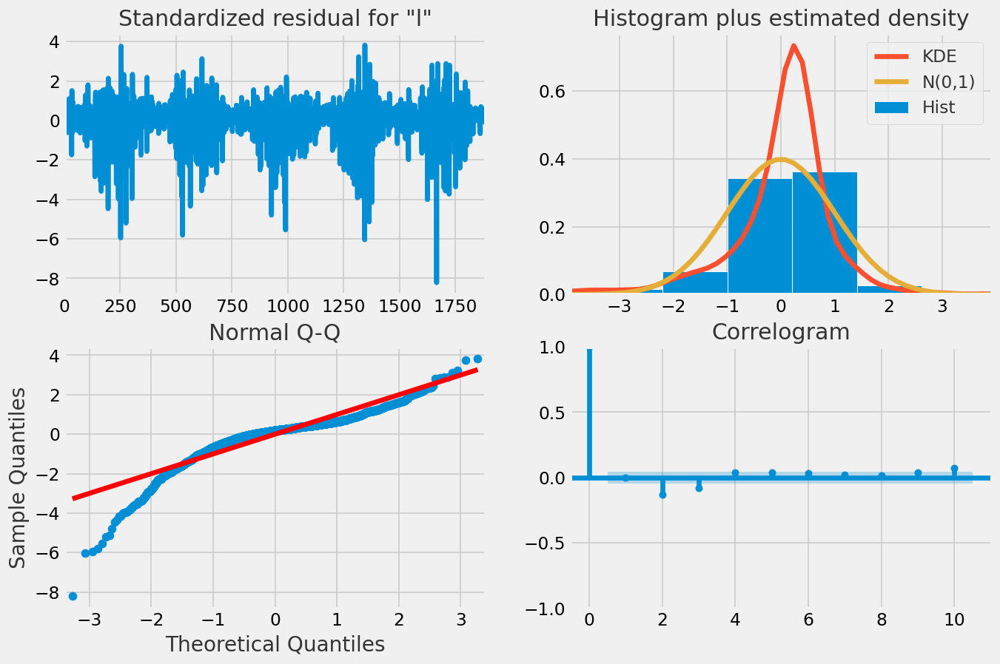

In [556]:
# Create the 4 diagnositcs plots
fig = plt.figure(figsize=(12,8))
logsqrtmodel_fit.plot_diagnostics(fig=fig)
plt.show() 

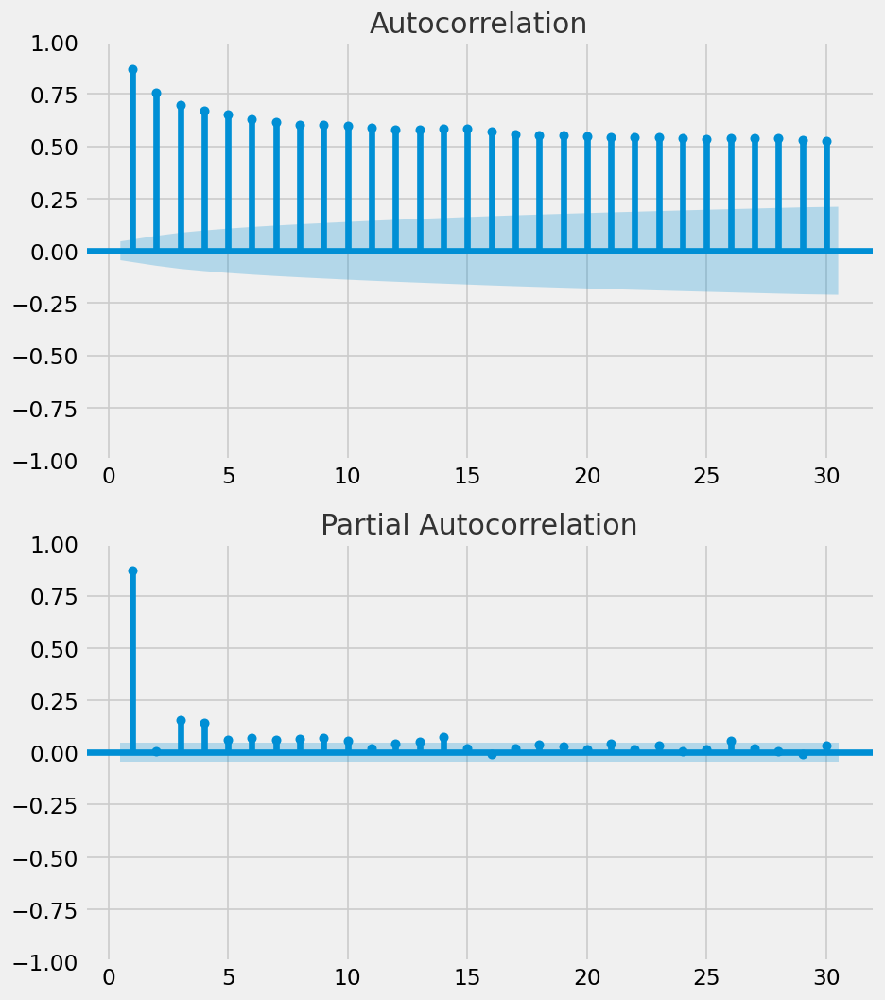

In [553]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 10))
plt.title("ACF & PACF with One Order Differencing")
plot_acf(statC_df.log, zero=False, lags=30, ax=ax1)
plot_pacf(statC_df.log, zero=False, lags=30, ax=ax2);

In [551]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(statC_df.log, order = (1,0,1))
logmodel_fit = model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   sqrt   No. Observations:                 1887
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -694.276
Date:                Sat, 23 Sep 2023   AIC                           1394.552
Time:                        00:58:24   BIC                           1411.179
Sample:                             0   HQIC                          1400.675
                               - 1887                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6399      0.021     30.640      0.000       0.599       0.681
ma.L1         -0.9256      0.011    -83.033      0.000      -0.947      -0.904
sigma2         0.1222      0.002     53.230      0.000       0.118       0.127
===================================================================================
Ljung-Box (L1) (Q):                  11.12   Jarque-Bera (JB):              1922.03
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.01   Skew:                            -1.26
Prob(H) (two-sided):                  0.94   Kurtosis:                         7.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

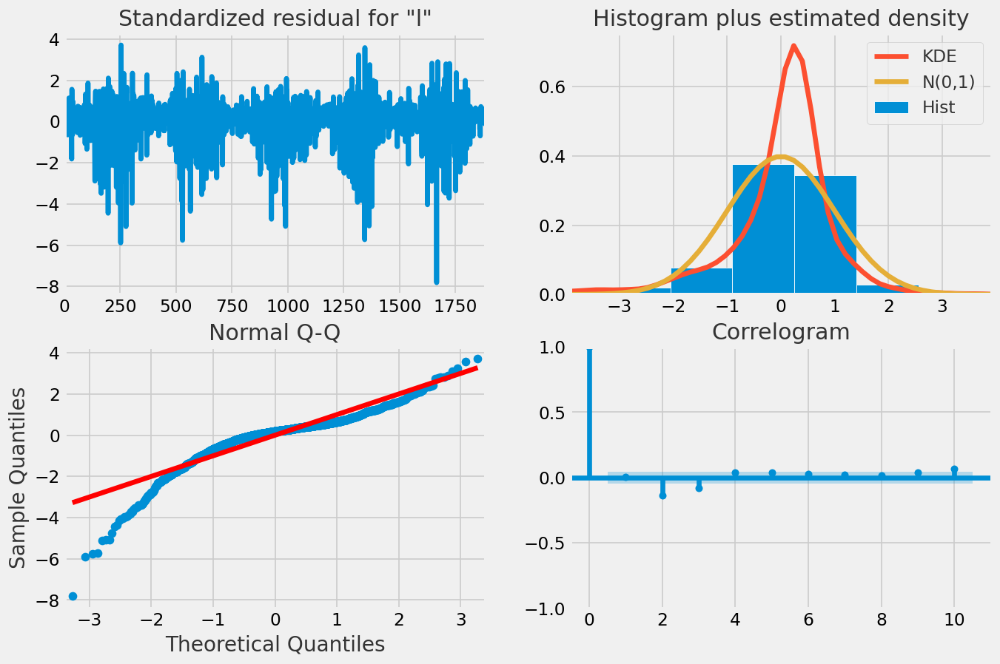

In [552]:
# Create the 4 diagnositcs plots
fig = plt.figure(figsize=(12,8))
logmodel_fit.plot_diagnostics(fig=fig)
plt.show() # Use plt.show() here explicitly to avoid creating a duplicate plot

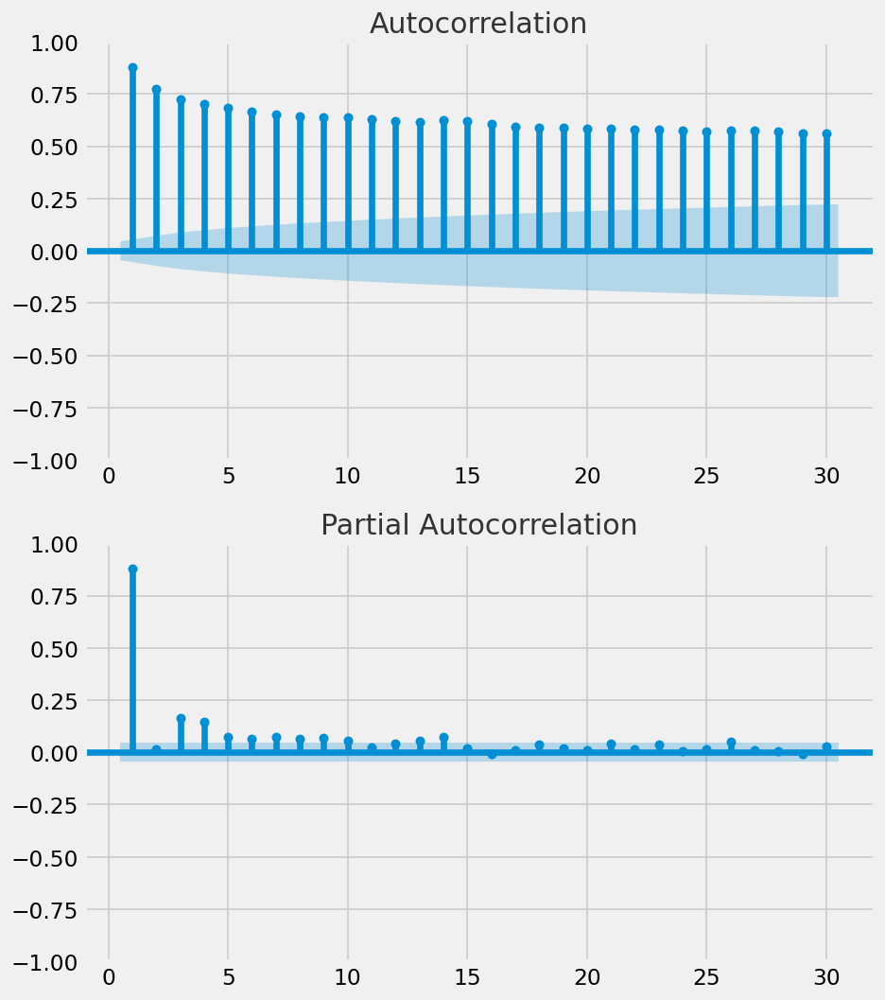

In [544]:
fig, (ax1, ax2) = plt.subplots(2,1, figsize=(8, 10))
plt.title("ACF & PACF with One Order Differencing")
plot_acf(statC_df.sqrt, zero=False, lags=30, ax=ax1)
plot_pacf(statC_df.sqrt, zero=False, lags=30, ax=ax2);

In [545]:
from statsmodels.tsa.arima.model import ARIMA
model = ARIMA(statC_df.sqrt, order = (1,1,1))
sqrtmodel_fit = model.fit()
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                   sqrt   No. Observations:                 1887
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -694.276
Date:                Sat, 23 Sep 2023   AIC                           1394.552
Time:                        00:55:05   BIC                           1411.179
Sample:                             0   HQIC                          1400.675
                               - 1887                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6399      0.021     30.640      0.000       0.599       0.681
ma.L1         -0.9256      0.011    -83.033      0.000      -0.947      -0.904
sigma2         0.1222      0.002     53.230      0.000       0.118       0.127
===================================================================================
Ljung-Box (L1) (Q):                  11.12   Jarque-Bera (JB):              1922.03
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               1.01   Skew:                            -1.26
Prob(H) (two-sided):                  0.94   Kurtosis:                         7.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

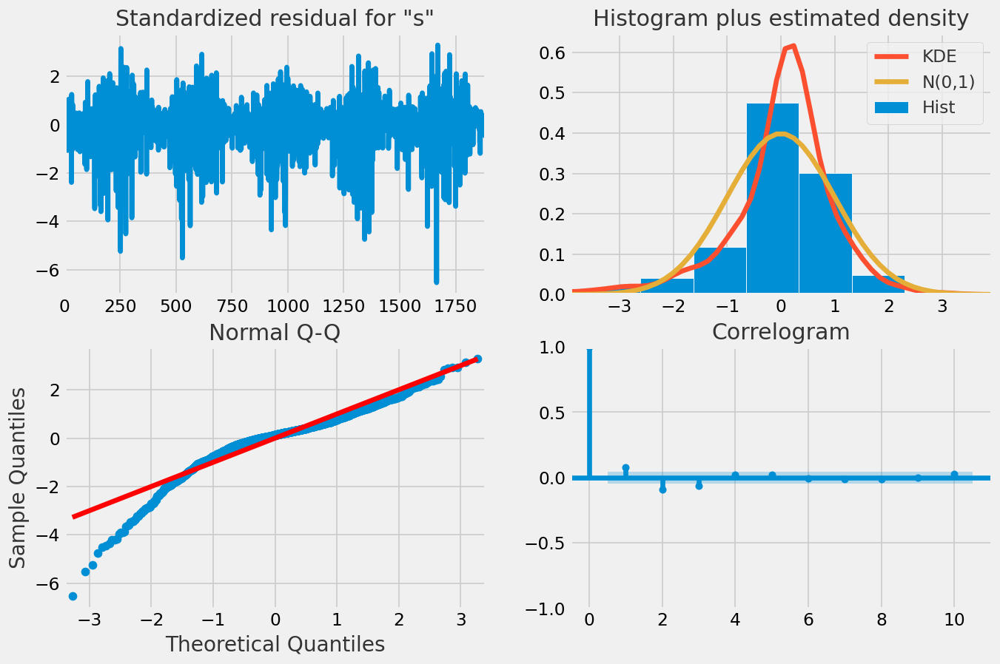

In [546]:
# Create the 4 diagnositcs plots
fig = plt.figure(figsize=(12,8))
sqrtmodel_fit.plot_diagnostics(fig=fig)
plt.show() # Use plt.show() here explicitly to avoid creating a duplicate plot

In [579]:
tst_log=statC_df[["logsqrt"]]
tst_log.head()

,logsqrt
0,2.131501
1,2.131999
2,2.136921
3,2.126450
4,2.133735


In [580]:
tst_mean=statC_df[["tmeans"]]
tst_mean.head()

,tmeans
0,94.0
1,94.2
2,96.2
3,92.0
4,94.9


In [583]:
from sklearn.metrics import mean_squared_error
from math import sqrt
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, r2_score

X = tst_mean.values # or tst_log
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
 model = ARIMA(history, order=(1,1,1))
 model_fit = model.fit()
 output = model_fit.forecast()
 yhat = output[0]
 predictions.append(yhat)
 obs = test[t]
 history.append(obs)
 #print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
r2= r2_score(test, predictions)
mse= mean_squared_error(test, predictions)
mape= mean_absolute_percentage_error(test, predictions)
        #rmse.append(np.sqrt(mean_squared_error(test, pred)))
print('Test RMSE: %.3f' % rmse)
print('Test R-square: %.3f' % r2)
print('Test MSE: %.3f' % mse)
print('Test Mean Absolute percentage Error: %.3f' % mape)

Test RMSE: 6.041
Test R-square: 0.793
Test MSE: 36.493
Test Mean Absolute percentage Error: 0.063


#### with tmeans
- Test RMSE: 6.041
- Test R-square: 0.793
- Test MSE: 36.493
- Test Mean Absolute percentage Error: 0.063
    
#### with logsqrt
- Test RMSE: 0.023
- Test R-square: 0.738
- Test MSE: 0.001
- Test Mean Absolute percentage Error: 0.007

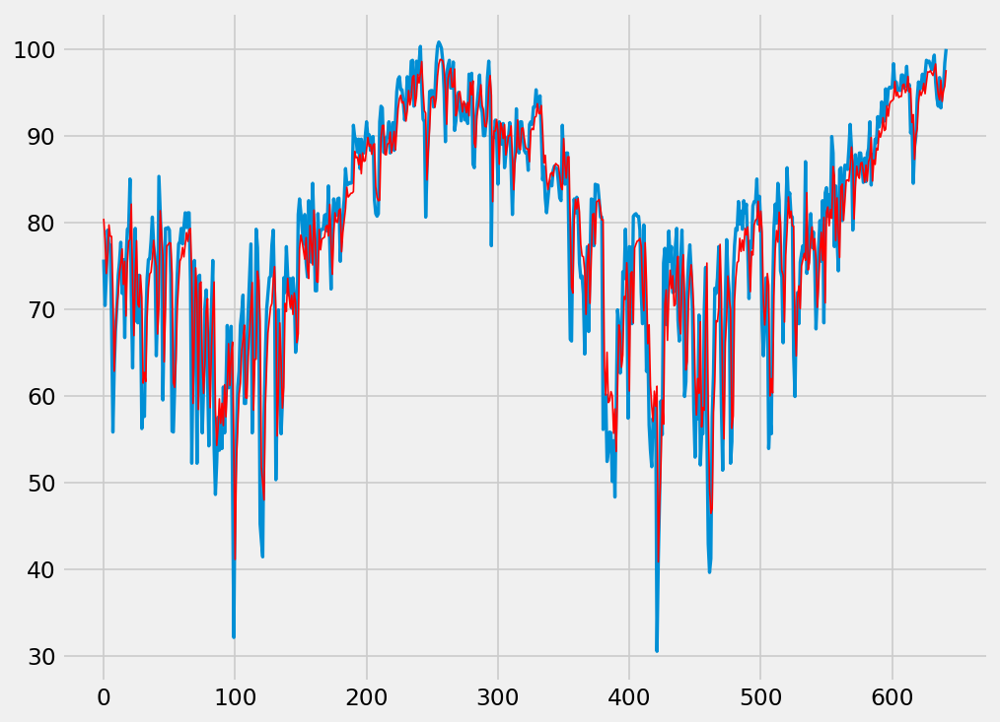

In [560]:
# plot forecasts against actual outcomes
# with tmeans

plt.plot(test, lw=2)
plt.plot(predictions, color='red',lw=1)
plt.show()

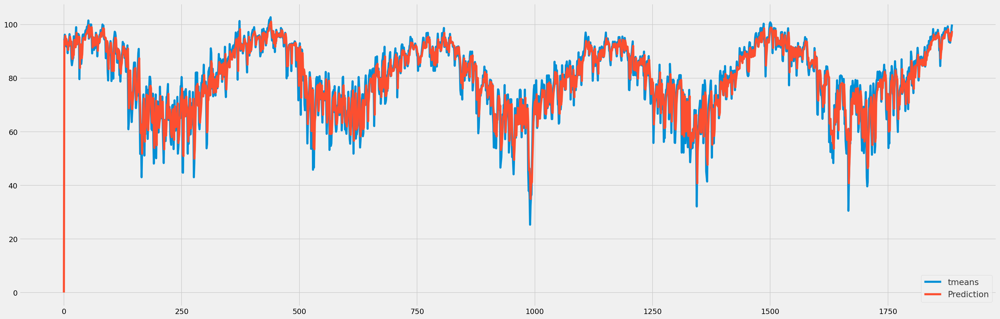

In [584]:
## with tmeans
final_model_mean=ARIMA(tst_mean,order=(1,1,1)).fit()
prediction=final_model.predict()


tst_mean.plot(legend=True, label='Actual',figsize=(30,10));
prediction.plot(legend=True,label='Prediction');
plot_predict(final_model_mean, dynamic=False, ax=ax);
plt.legend(fontsize=16)

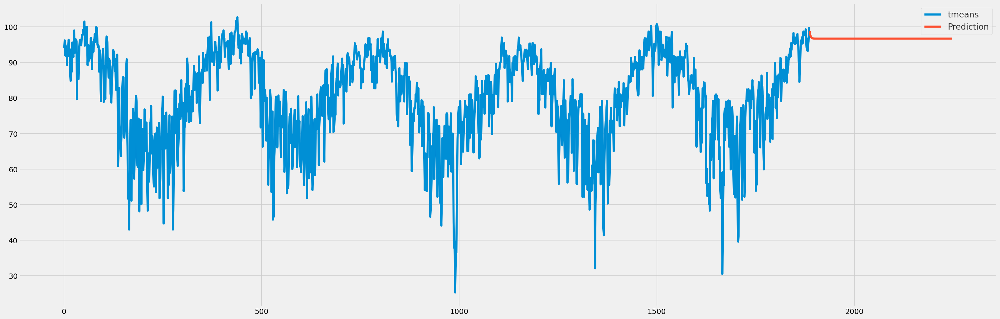

In [585]:
prediction2=arima_model.predict(len(tst_mean),len(tst_mean)+360)
arima_model=ARIMA(ts_mean,order=(1,1,1)).fit()

tst_mean.plot(legend=True, label='Actual',figsize=(30,10));
prediction2.plot(legend=True,label='Prediction');
plot_predict(final_model, dynamic=False, ax=ax);
plt.legend(fontsize=16)

In [588]:
import statsmodels.api as sm
model=sm.tsa.statespace.SARIMAX(tst["tmeans"],order=(1, 1, 1),seasonal_order=(1,1,1,360))
results=model.fit()
tst['forecast']=results.predict(start=1800,end=3000,dynamic=True)
#fcast = model_fit.forecast(fcast_len)
tst[['tmeans','forecast']].plot(figsize=(12,8))

KeyboardInterrupt: 

In [ ]:
## logsqrt

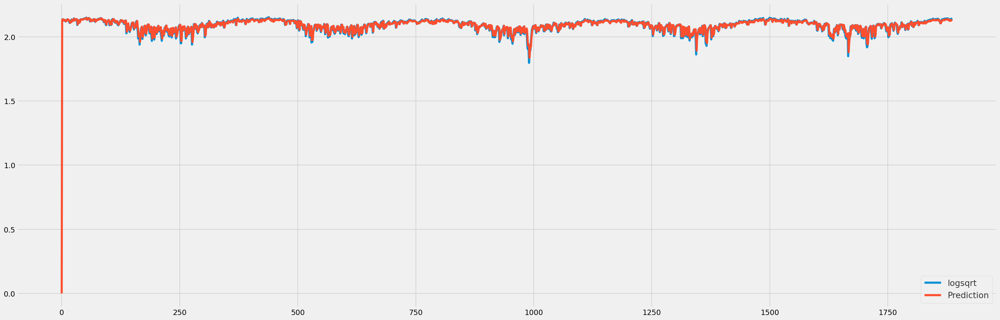

In [571]:
final_model=ARIMA(ts_t,order=(1,1,1)).fit()
prediction=final_model.predict()

ts_t.plot(legend=True, label='Actual',figsize=(30,10));
prediction.plot(legend=True,label='Prediction');
plot_predict(final_model, dynamic=False, ax=ax);
plt.legend(fontsize=16)


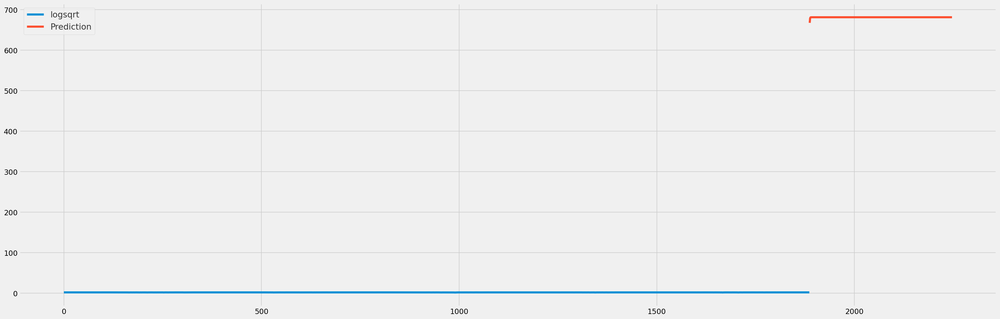

In [573]:
prediction2=arima_model.predict(len(ts),len(ts)+360)
arima_model=ARIMA(ts_t,order=(1,1,1)).fit()

ts_t.plot(legend=True, label='Actual',figsize=(30,10));
prediction2.plot(legend=True,label='Prediction');
plot_predict(final_model, dynamic=False, ax=ax);
plt.legend(fontsize=16)